# Setup

Install in R:
```
install.packages("BiocManager")
BiocManager::install(c("edgeR", "BiocParallel", "RhpcBLASctl"))
```

Install

```pip install toytree ete4 pybiomart```

## Options & Data

In [ ]:
%load_ext autoreload
%autoreload 2

import os
import re
import pickle
import matplotlib.pyplot as plt
import warnings
import logging
import seaborn as sns
from scipy.sparse import issparse
from pymer4.models import lmer, lm, glmer, compare
from pymer4 import config
import polars
import statsmodels.api as sm
import senepy
import gseapy as gp
import pertpy as pt
import scanpy as sc
import pandas as pd
import numpy as np
import scflow
from scflow.ax import find_senescence_genes, run_senepy

# Display/Environment Settings
os.environ["KMP_DUPLICATE_LIB_OK"] = "True"
warnings.filterwarnings("ignore", message=".*ast.Ellipsis is deprecated.*")
config.PANDAS_BACKEND = True
warnings.filterwarnings("ignore", message=".*vert.*will be deprecated.*")
pd.set_option("display.max_rows", 500)  # or None for unlimited rows
pd.set_option("display.max_columns", 100)
pd.set_option("display.max_colwidth", 100)
pd.set_option("display.width", 300)
warnings.filterwarnings(
    "ignore", message="Bitwise inversion '~' on bool is deprecated",
    category=DeprecationWarning)

# Process Options
ncpus = os.cpu_count() - 1
overwrite = True

# If You Want Results Emailed (Will Overwrite HTML Regardless of `overwite`)
cur_file = os.path.join(os.path.abspath(""), "analyze_senescence_celltype_"
                        "specific_threshold_SRR23052428.ipynb")
html_out = os.path.splitext(cur_file)[0] + ".html"
email = "elizabeth.aslinger@aya.yale.edu"
# set email to None to skip

# Metadata Information
col_celltype = "annotation_by_overlap"
species = "Mouse"
col_sample, col_batch = "sample", "Condition"
col_condition = "Condition"
keys = {col_condition: dict(key_control="Control",
                            key_treatment="Irradiated")}
palette = {keys[col_condition]["key_control"]: "c",
           keys[col_condition]["key_treatment"]: "tab:pink"}
palette = {col_batch: palette, col_condition: palette}

# Scoring Metrics
sen_metrics = ["senmayo"]
use_metric = "senmayo"
percentile = 1

# File Input & Output
file_path = "data/SRR23052428_SRR23052429_integrated.h5ad"
file_path_new = os.path.splitext(file_path)[0] + "_analyzed.h5ad"

# Load Data
self = scflow.Rna(file_path, col_sample=col_sample,
                  col_celltype=col_celltype, col_batch=col_batch)

# Display Object
print(self.rna)
self.rna.obs

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/senepy/load_hubs.py:3: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_filename
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/marshmallow/__init__.py:17: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  __version_info__ = tuple(LooseVersion(__version__).version)
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/marshmallow/fields.py:198: RemovedInMarshmallow4Warning: Passing field metadata as a keyword arg is deprecated. Use the explicit `metadata=...` argument instead.
  warnings.warn(


AnnData object with n_obs × n_vars = 31446 × 23253
    obs: 'sample', 'n_cells_original_sample', 'Condition', 'kws_pp_sample', 'n_genes_by_counts', 'total_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'log1p_total_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'log1p_total_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'log1p_total_counts_hb', 'n_counts', 'n_genes', 'doublet_score', 'predicted_doublet', 'leiden_individual_res0.15dist0.15', 'annotation_by_markers_individual_res0.15dist0.15', 'annotation_by_markers_individual_heterogeneous_collapsed', 'leiden_individual', 'annotation_by_markers_individual', 'kws_cluster_individual', 'annotation_scanvi', 'kws_integrate', 'leiden', 'leiden_resolution', 'leiden_n_neighbors', 'leiden_min_dist', 'annotation_by_overlap', 'leiden_subcluster', 'resolution_leiden_subcluster', 'annotation_toppgene', 'predicted_labels', 'majority_voting', 'majority_voting_probabilities', 'annotation_predicted_

,sample,n_cells_original_sample,Condition,kws_pp_sample,n_genes_by_counts,total_counts,log1p_n_genes_by_counts,log1p_total_counts,total_counts_mt,pct_counts_mt,log1p_total_counts_mt,total_counts_ribo,pct_counts_ribo,log1p_total_counts_ribo,total_counts_hb,pct_counts_hb,log1p_total_counts_hb,n_counts,n_genes,doublet_score,predicted_doublet,leiden_individual_res0.15dist0.15,annotation_by_markers_individual_res0.15dist0.15,annotation_by_markers_individual_heterogeneous_collapsed,leiden_individual,annotation_by_markers_individual,kws_cluster_individual,annotation_scanvi,kws_integrate,leiden,leiden_resolution,leiden_n_neighbors,leiden_min_dist,annotation_by_overlap,leiden_subcluster,resolution_leiden_subcluster,annotation_toppgene,predicted_labels,majority_voting,majority_voting_probabilities,annotation_predicted_labels,annotation_majority_voting
AAACCCAAGAGTTCGG-1_SRR23052428,SRR23052428,22119,Irradiated,"{'min_max_genes': [426, None], 'min_max_cells': [3, None], 'max_mt': 5, 'min_max_counts': [581, ...",765,1941.574829,6.641182,7.571770,9.624470,0.495704,2.363160,7.865369,0.405103,2.182153,0.000000,0.000000,0.000000,993.0,767,0.002254,False,3,Pericyte,Pericyte,3,Pericyte,"{'resolution': 0.15, 'min_dist': 0.15, 'n_comps': 50}",Pericyte,"{'col_celltype': 'annotation_by_markers_individual_heterogeneous_collapsed', 'flavor': 'scanvi',...",5,0.05,40,1,Endothelial,5,0.07,Endothelial,331 Peri NN,331 Peri NN,0.992559,Pericyte,Pericyte
AAACCCAAGATTGTGA-1_SRR23052428,SRR23052428,22119,Irradiated,"{'min_max_genes': [426, None], 'min_max_cells': [3, None], 'max_mt': 5, 'min_max_counts': [581, ...",2007,3194.267334,7.604894,8.069426,1.350562,0.042281,0.854654,14.969015,0.468621,2.770650,1.350562,0.042281,0.854654,3499.0,2009,0.041719,False,0,Oligodendrocyte,Oligodendrocyte,0,Oligodendrocyte,"{'resolution': 0.15, 'min_dist': 0.15, 'n_comps': 50}",Oligodendrocyte,"{'col_celltype': 'annotation_by_markers_individual_heterogeneous_collapsed', 'flavor': 'scanvi',...",0,0.05,40,1,Neuron,"0,0",0.07,"0,0",031 CT SUB Glut,Heterogeneous,NaN,Excitatory,Heterogeneous
AAACCCAAGTGCCAGA-1_SRR23052428,SRR23052428,22119,Irradiated,"{'min_max_genes': [426, None], 'min_max_cells': [3, None], 'max_mt': 5, 'min_max_counts': [581, ...",2399,3327.978516,7.783224,8.110421,1.075810,0.032326,0.730351,18.731564,0.562851,2.982220,0.000000,0.000000,0.000000,5175.0,2399,0.028328,False,7,Inhibitory,Inhibitory,7,Inhibitory,"{'resolution': 0.15, 'min_dist': 0.15, 'n_comps': 50}",Inhibitory,"{'col_celltype': 'annotation_by_markers_individual_heterogeneous_collapsed', 'flavor': 'scanvi',...",0,0.05,40,1,Neuron,"0,0",0.07,"0,0",049 Lamp5 Gaba,049 Lamp5 Gaba,0.997975,Inhibitory,Inhibitory
AAACCCAAGTTGAATG-1_SRR23052428,SRR23052428,22119,Irradiated,"{'min_max_genes': [426, None], 'min_max_cells': [3, None], 'max_mt': 5, 'min_max_counts': [581, ...",2280,3235.130127,7.732369,8.082133,5.981792,0.184901,1.943306,7.076156,0.218729,2.088916,0.000000,0.000000,0.000000,5032.0,2280,0.021174,False,1,Astrocyte,Astrocyte,1,Astrocyte,"{'resolution': 0.15, 'min_dist': 0.15, 'n_comps': 50}",Astrocyte,"{'col_celltype': 'annotation_by_markers_individual_heterogeneous_collapsed', 'flavor': 'scanvi',...",2,0.05,40,1,Astrocyte,2,0.07,Astrocyte,318 Astro-NT NN,318 Astro-NT NN,0.996337,Astrocyte,Astrocyte
AAACCCACAATTCTTC-1_SRR23052428,SRR23052428,22119,Irradiated,"{'min_max_genes': [426, None], 'min_max_cells': [3, None], 'max_mt': 5, 'min_max_counts': [581, ...",924,2098.277344,6.829794,7.649348,6.093319,0.290396,1.959153,10.780834,0.513794,2.466474,0.000000,0.000000,0.000000,1510.0,924,0.050669,False,9,OPC,OPC,9,OPC,"{'resolution': 0.15, 'min_dist': 0.15, 'n_comps': 50}",OPC,"{'col_celltype': 'annotation_by_markers_individual_heterogeneous_collapsed', 'flavor': 'scanvi',...",4,0.05,40,1,OPC,4,0.07,OPC,326 OPC NN,326 OPC NN,0.020204,OPC,OPC
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.

# Get Marker Gene Sets

From Google Drive, except senmayo derived from file downloaded from
https://www.gsea-msigdb.org/gsea/msigdb/human/geneset/SAUL_SEN_MAYO.html
then created using:

```
from pybiomart import Server

senmayo = pd.read_csv("resources/SAUL_SEN_MAYO.v2025.1.Hs.tsv",
                      sep="\t", header=0)
senmayo = senmayo[senmayo.STANDARD_NAME == "GENE_SYMBOLS"]
senmayo = pd.Series({"Senmayo": senmayo.iloc[0, 1].split(
    ",")}, name="symbol").rename_axis("Gene_Set").explode().str.strip(
        ).replace("", np.nan).dropna().to_frame()
server = Server(host="http://www.ensembl.org")
mart = server.marts["ENSEMBL_MART_ENSEMBL"] # Access the Ensembl mart
human_dataset = mart.datasets["hsapiens_gene_ensembl"]
orthologs = human_dataset.query(attributes=[
    "external_gene_name", "mmusculus_homolog_associated_gene_name"])
orthologs = orthologs.dropna().set_index(orthologs.columns[0])
orthologs = orthologs.loc[orthologs.index.intersection(
    senmayo.symbol.to_list())].iloc[:, 0]
print(f"{orthologs.shape[0]} orthologs found out of"
      f" {len(senmayo.symbol.unique())} senmayo genes")
senmayo = senmayo.assign(symbol=senmayo.replace({"symbol": dict(zip(
    orthologs.index, orthologs.values))}))
senmayo.to_csv("gene_sets/senmayo.csv")
```

(Also could use `scflow.tl.convert_gene_species(senmayo.symbol.to_list())`)

Certain gene sets created from Google Drive ADBR AWG > Projects > White Matter > Gene Sets files (with the suffix = "_adjusted") were modified for consistency, e.g.,

```
pd.read_csv("gene_sets/_iron_genes_gmt_out.csv", index_col=[
    0, 1]).rename_axis(["row_id", "pathway"]).stack().to_frame(
        "symbol").reset_index(-1, drop=True).reset_index().to_csv(
            "gene_sets/_iron_genes_gmt_out_adjusted.csv")
```


In [14]:
%matplotlib inline

mks = [pd.read_csv(os.path.join("gene_sets", i)).dropna(
    how="all", axis=1).assign(Source_File=i) for i in os.listdir("gene_sets")]
mks = [x.assign(Gene_Set=x["Source_File"].iloc[0].split("_2025")[0]) if (
    "pathway" in x) else x for x in mks]
mks = pd.concat(mks).drop("Unnamed: 0", axis=1).drop("row_id", axis=1)
mks = mks[mks.symbol.isin(self.rna.var_names)]
mks = mks[["Gene_Set", "symbol"]].set_index("Gene_Set").groupby(
    "Gene_Set").apply(lambda x: x["symbol"].to_list())
marker_genes_dict = dict(mks)
marker_gene_sets = mks.copy()
print(marker_gene_sets)

Gene_Set
GOBP_CELLULAR_RESPONSE_TO_IRON_ION                                                                                                                                                                                                       [B2m, Bmp6, Gpld1, Hfe, Ireb2, Tfap2a, Tfr2, Tfrc, Trf]
GOBP_CENTRAL_NERVOUS_SYSTEM_MYELIN_FORMATION                                                                                                                                                                                                [Abca2, Ckap5, Cntn1, Ercc2, Mag, Mios, Tenm4, Tlr2]
GOBP_INTRACELLULAR_IRON_ION_HOMEOSTASIS                                                                                                                                                      [Abcb7, Aco1, Alas2, Atp13a2, Atp6ap1, Atp6v0a2, Atp6v0d1, Atp6v1a, Atp6v1g1, B2m, Bdh2, Bmp6, B...
GOBP_IRON_COORDINATION_ENTITY_TRANSPORT                                                                                     

# Score Senescence

## Run Scoring

If you want just to find the senescence-related genes, run:

```
tissue = "Brain"  # or whatever you want here
celltype = None  # or whatever you want here
genes_senepy, hubs, figs = find_senescence_genes(
    self.rna, species=species, tissue=tissue, celltype=celltype,
    overlap_threshold=0, literature_sources=None,
    sengpt_sources=True, plot=True, col_celltype=col_celltype
)  # find tissue- and/or cell type-specific genes
```

To see available hubs:

```
hubs = senepy.load_hubs(species=species)
hubs.metadata.set_index(["tissue", "cell"]).sort_index()
```

Other examples of arguments you could use:

```
# tissue = ["Brain", "Myeloid"]
# tissue = None

# celltype = "GABA interneuron"  # only human I think
# celltype = ["microglia", "t cell", "monocyte"]
# celltype = "microglia"
# celltype = "microglial cell"`

In [3]:
sc.tl.score_genes(self.rna, marker_gene_sets.loc["Senmayo"],
                  ctrl_as_ref=True, ctrl_size=50, gene_pool=None,
                  n_bins=25, score_name="score_senmayo", random_state=0,
                  copy=False, layer="log1p", use_raw=False)

## Label SnCs

### Define Snc Threshold & Label Cells

Based on percentile threshold derived from control group

In [4]:
# Determine Threshold
perc_s, perc = str(100 - percentile) + "%", 1 - (percentile / 100)
p_h = 3
perc_s_h, perc_h = str(100 - p_h) + "%", 1 - (p_h / 100)
print("Percentile for Threshold:", perc_s)
for u in sen_metrics:
    self.rna.obs = self.rna.obs.join(self.rna.obs[self.rna.obs[
        col_batch] == keys[col_batch]["key_control"]].groupby(
            col_celltype).apply(lambda x: x[f"score_{u}"].describe(
                percentiles=[perc])[perc_s], include_groups=False).to_frame(
                    f"Senescence_Threshold_{u}"), on=col_celltype).loc[
                        self.rna.obs.index]
    self.rna.obs = self.rna.obs.join(self.rna.obs[self.rna.obs[
        col_batch] == keys[col_batch]["key_control"]].groupby(
            col_celltype).apply(lambda x: x[f"score_{u}"].describe(
                percentiles=[perc_h])[perc_s_h],
                                include_groups=False).to_frame(
                                    f"Senescence_Threshold_{u}_{p_h}"),
                                on=col_celltype).loc[self.rna.obs.index]

# Binary CLassification
for x in sen_metrics:
    self.rna.obs.loc[:, f"Senescent_Cell_{x}"] = (self.rna.obs[
        f"score_{x}"] >= self.rna.obs[f"Senescence_Threshold_{x}"])
    self.rna.obs.loc[:, f"Senescent_Cell_{x}_{p_h}"] = (self.rna.obs[
        f"score_{x}"] >= self.rna.obs[f"Senescence_Threshold_{x}_{p_h}"])

# String Labels (for Plotting/Categorical Analysis)
for x in sen_metrics:
    self.rna.obs.loc[:, f"Senescent_Cell_Label_{x}"] = self.rna.obs[
        f"Senescent_Cell_{x}"].astype(bool).astype(str).replace({
            "True": "Senescent", "False": "Non-Senescent"})
    self.rna.obs.loc[:, f"Senescent_Cell_Label_hierarchy_{x}"] = self.rna.obs[
        f"Senescent_Cell_{x}"].astype(bool).astype(str).replace({
            "True": "Senescent", "False": "Non-Senescent"})
    self.rna.obs.loc[:, f"Senescent_Cell_Label_{x}_{p_h}"] = self.rna.obs[
        f"Senescent_Cell_{x}_{p_h}"].astype(bool).astype(str).replace({
            "True": "Senescent", "False": "Non-Senescent"})
    self.rna.obs.loc[:, f"Senescent_Cell_Label_by_Type_{x}"] = self.rna.obs[
        f"Senescent_Cell_Label_{x}"].replace({
            "Senescent": "SnC ", "Non-Senescent": ""}) + self.rna.obs[
                col_celltype].astype(str)
    # self.rna.obs.loc[:, f"SnC_hierarchy_{x}"] = self.rna.obs[
    #     f"Senescent_Cell_Label_{x}"].replace({
    #         "Senescent": "SnC ", "Non-Senescent": ""}) + self.rna.obs[
    #             col_celltype + "_hierarchy"].astype(str)

# Descriptives
for x in sen_metrics:
    print(x, round(self.rna.obs[[
        f"Senescent_Cell_Label_{x}", col_celltype]].value_counts(
            normalize=True).sort_index() * 100, 1).unstack(0))

# Choose Metrics for Main Analysis
colssen = ["Senescent_Cell_Label", "Senescent_Cell", "SnC_hierarchy",
           "Senescence_Threshold", "Senescent_Cell_Label_by_Type"]
colssen = [i for i in colssen if f"{i}_{use_metric}" in self.rna.obs]
for x in colssen:
    self.rna.obs.loc[:, x] = self.rna.obs[f"{x}_{use_metric}"]
self.rna.obs.loc[:, "senscore"] = self.rna.obs[f"score_{use_metric}"]
self.rna.obs.loc[
    :, f"Senescent_Cell_Label_by_Type_{use_metric}_{p_h}"] = self.rna.obs[
        f"Senescent_Cell_Label_{use_metric}_{p_h}"].replace({
            "Non-Senescent": "", "Senescent": "SnC "}).astype(
                str) + self.rna.obs[
                    col_celltype].astype(str)  # lower threshold SnC by type
genes = marker_gene_sets.loc["Senmayo"] if (
    use_metric == "senmayo") else genes_senepy  # main senescence gene list

# Avoid Nesting Duplication Issues
# self.rna.obs.loc[:, "SnC_hierarchy"] = self.rna.obs[
#     "SnC_hierarchy"].replace({
#         "Neuron": "Neurons", "SnC Neuron": "SnC Neurons"})

Percentile for Threshold: 99%
senmayo Senescent_Cell_Label_senmayo  Non-Senescent  Senescent
annotation_by_overlap                                 
Neuron                                 53.4        0.5
Oligodendrocyte                        14.4        0.2
Astrocyte                               8.6        0.0
Microglial                              7.2        0.1
OPC                                     5.3        0.0
Endothelial                            10.1        0.1


### Label Batch/Cell-Specific Senescence Percentiles

In [5]:
# for x in ["Senescence_Label", "Senescence_CellType"]:
#     if x in self.rna.obs:
#         self.rna.obs = self.rna.obs.drop(x, axis=1)

# # %ile Thresholds (Overall)
# thresh = self.rna.obs["score_senepy"].describe(
#     percentiles=[0.90, 0.95, 0.99])
# thres_ct =  self.rna.obs[["score_senepy", col_celltype]].groupby(
#     col_celltype).describe(percentiles=[0.90, 0.95, 0.99])["score_senepy"]

# sen = self.rna.obs["score_senepy"].apply(
#     lambda x: "Top 1%" if x >= float(thresh.loc["99%"]) else "Top 5%" if (
#         x >= float(thresh.loc["95%"])) else "Top 10%" if x >= float(
#             thresh.loc["90%"]) else "Bottom 90%").to_frame(
#                 "Senescence_Label").loc[self.rna.obs.index]
# self.rna.obs = self.rna.obs.join(sen).loc[self.rna.obs.index]

# # %ile Thresholds (by Cell Type)
# sct = self.rna.obs.groupby(
#     col_celltype).apply(lambda g: g["score_senepy"].apply(
#         lambda x: f"Top 1% {g.name}" if x >= float(thres_ct.loc[g.name][
#             "99%"]) else f"Top 5% {g.name}" if (x >= float(thres_ct.loc[
#                 g.name]["95%"])) else f"Top 10% {g.name}" if x >= float(
#                     thres_ct.loc[g.name]["90%"]) else g.name),
#                         include_groups=False)

# sct = sct.to_frame("Senescence_CellType").reset_index(0, drop=True)
# sct = sct.loc[self.rna.obs.index]
# self.rna.obs = self.rna.obs.join(sct).loc[self.rna.obs.index]

# for x in ["Senescence_Label", "Senescence_CellType"]:
#     self.rna.obs = self.rna.obs.assign(**{
#         x: self.rna.obs[x].astype("category")})

# high_sen_cts = [i for i in self.rna.obs["Senescence_CellType"].unique(
#     ) if " 1% " in i]

### Descriptives of SnCs

In [6]:
print("Percent Senescent: \n\n", round(self.rna.obs.groupby([
    col_celltype, col_batch]).apply(lambda x: x["Senescent_Cell"].astype(
        int).value_counts(normalize=True), include_groups=False) * 100,
    2).unstack(col_celltype))
sns.catplot(self.rna.obs, y="Senescent_Cell", x=col_celltype,
            hue=col_batch, kind="bar", height=10)

Percent Senescent: 

 Senescent_Cell             0                                                              1                                                       
annotation_by_overlap Neuron Oligodendrocyte Astrocyte Microglial    OPC Endothelial Neuron Oligodendrocyte Astrocyte Microglial   OPC Endothelial
Condition                                                                                                                                         
Control                99.00           98.99     99.00      98.98  99.00       98.98   1.00            1.01      1.00       1.02  1.00        1.02
Irradiated             99.13           98.69     99.77      99.23  99.27       98.48   0.87            1.31      0.23       0.77  0.73        1.52


# SnC DEGs

## Overall

In [7]:
p_threshold = 1e-10
lfc_threshold = 1
self.find_markers(col_celltype="Senescent_Cell_Label_by_Type")
df_snc_markers = {}
df_snc_markers["All"] = self.get_markers_df(
    n_genes=50, col_celltype="Senescent_Cell_Label_by_Type",
    log2fc_threshold=1, p_threshold=1e-10)
# print(df_snc_markers["All"].loc[pd.unique([
#     i[0] for i in df_snc_markers["All"].index.values if (
#         "SnC" in i[0])])].groupby("Senescent_Cell_Label_by_Type").apply(
#             lambda x: x.head(3)))
for x in self.rna.obs[col_celltype].unique():
    df_snc_markers[x] = self.find_markers(
        col_celltype="Senescent_Cell_Label_by_Type",
        reference=x, groups=[x, f"SnC {x}"], rankby_abs=True,
        inplace=False).reset_index(0, drop=True).assign(**{
            col_celltype: f"SnC {x}"}).reset_index().set_index([
                col_celltype, "names"])
df_snc_markers = pd.concat(df_snc_markers, names=["Comparison"])
df_snc_markers = df_snc_markers.rename_axis([
    "Comparison", col_celltype, "names"]).rename({
        "logfoldchanges": "log_fc"}, axis=1).assign(
            log_fc_abs=df_snc_markers["logfoldchanges"].abs())
df_snc_markers_top = df_snc_markers[df_snc_markers.pvals_adj < p_threshold]
df_snc_markers_top = df_snc_markers_top[
    df_snc_markers.log_fc_abs >= lfc_threshold]
df_snc_markers_top = df_snc_markers_top.groupby([
    "Comparison", col_celltype]).apply(
        lambda x: x.assign(scores_abs=x.scores.abs()).sort_values(
            "scores_abs", ascending=False).head(20),
        include_groups=False).reset_index([0, 1], drop=True)

... storing 'Senescent_Cell_Label_senmayo' as categorical
... storing 'Senescent_Cell_Label_hierarchy_senmayo' as categorical
... storing 'Senescent_Cell_Label_senmayo_3' as categorical
... storing 'Senescent_Cell_Label_by_Type_senmayo' as categorical
... storing 'Senescent_Cell_Label' as categorical
... storing 'Senescent_Cell_Label_by_Type' as categorical
... storing 'Senescent_Cell_Label_by_Type_senmayo_3' as categorical
... storing 'Senescent_Cell_Label_hierarchy_senmayo' as categorical
... storing 'Senescent_Cell_Label_senmayo_3' as categorical
... storing 'Senescent_Cell_Label_by_Type_senmayo' as categorical
... storing 'Senescent_Cell_Label' as categorical
... storing 'Senescent_Cell_Label_by_Type' as categorical
... storing 'Senescent_Cell_Label_by_Type_senmayo_3' as categorical


## By Group

In [8]:
res_rank_genes, p_threshold = {}, 1e-10
for x in self.rna.obs[col_batch].unique():
    res_rank_genes[x] = {}
    for c in self.rna.obs[self.rna.obs[col_batch] == x][
            col_celltype].unique():
        s_iter = (self.rna.obs[col_batch] == x) & (self.rna.obs[
            "Senescent_Cell_Label_by_Type"].isin([c, f"SnC {c}"]))
        tmp = sc.tl.rank_genes_groups(
            self.rna[s_iter], "Senescent_Cell_Label_by_Type", rankby_abs=True,
            layer="log1p", groups=[c, f"SnC {c}"], reference=c, copy=True)
        res_rank_genes[x][c] = sc.get.rank_genes_groups_df(
            tmp, f"SnC {c}", pval_cutoff=p_threshold)
    tmp = sc.tl.rank_genes_groups(
            self.rna[self.rna.obs[col_batch] == x],
            "Senescent_Cell_Label", rankby_abs=True,
            layer="log1p", reference="Non-Senescent", copy=True)
    res_rank_genes[x]["Overall"] = sc.get.rank_genes_groups_df(
            tmp, f"Senescent", pval_cutoff=p_threshold)
    res_rank_genes[x] = pd.concat(res_rank_genes[x], names=[col_celltype])
res_rank_genes = pd.concat(res_rank_genes, names=[col_batch])
res_rank_genes = res_rank_genes.assign(
    logfoldchanges_abs=res_rank_genes.logfoldchanges.abs())
res_rank_genes_top = res_rank_genes.reset_index().groupby([
    col_batch, col_celltype]).apply(
        lambda x: x.sort_values("logfoldchanges_abs").iloc[:20],
        include_groups=False).reset_index(2, drop=True).set_index(
            "names", append=True).rename_axis([
                col_batch, col_celltype, "variable"])
res_rank_genes_top

level_2     scores  logfoldchanges         pvals     pvals_adj  logfoldchanges_abs
Condition  annotation_by_overlap variable                                                                                              
Control    Astrocyte             Gask1a                 2280  -6.899581      -26.121424  9.310845e-12  9.491674e-11           26.121424
                                 Impa1                  2205  -6.990173      -26.129885  5.050043e-12  5.323148e-11           26.129885
                                 Gm4631                 2289  -6.891666      -26.156315  9.818823e-12  9.970179e-11           26.156315
                                 Cox20                  2281  -6.899323      -26.160561  9.327006e-12  9.503982e-11           26.160561
                                 Prr3                   2233  -6.959009      -26.185480  6.237844e-12  6.492774e-11           26.185480
                                 Nacc1                  2229  -6.962988      -26.185501  6.072125e-12  6.331620e-11           26.185501
                                 B4gat1                 2209  -6.986256      -26.186867  5.186150e-12  5.456722e-11           26.186867
                                 Ankrd13b               2207  -6.987902      -26.208654  5.128528e-12  5.400981e-11           26.208654
                                 Acad11                 1991  -7.287731      -26.212959  6.448995e-13  7.528036e-12           26.212959
                                 Mxd1                   2286  -6.894303      -26.223953  9.646633e-12  9.808184e-11           26.223953
                                 Puf60                  2272  -6.909818      -26.227179  8.691965e-12  8.891961e-11           26.227179
                                 Nelfa                  2217  -6.976876      -26.233416  5.526904e-12  5.794278e-11           26.233416
                                 Smarcd2                2179  -7.029249      -26.234095  3.870448e-12  4.128419e-11           26.234095
                                 Fastkd1                2144  -7.076927      -26.236900  2.792794e-12  3.027545e-11           26.236900
                                 C1qb                   2276  -6.905093      -26.239056  8.972439e-12  9.162764e-11           26.239056
                                 Metrn                  2188  -7.016893      -26.241781  4.210715e-12  4.472898e-11           26.241781
                                 Srfbp1                 2095  -7.155615      -26.247286  1.623019e-12  1.800575e-11           26.247286
                                 Zscan22                2135  -7.090904      -26.250580  2.537091e-12  2.761938e-11           26.250580
                                 Tmem62                 2273  -6.908015      -26.250883  8.797921e-12  8.996397e-11           26.250883
                                 Rnf181                 2161  -7.058301      -26.252621  3.173249e-12  3.412931e-11           26.252621
           Endothelial           Zfp783                 1602  -6.949718      -26.358297  6.713847e-12  9.739058e-11           26.358297
                                 Itpk1                  1588  -6.977891      -26.359802  5.549072e-12  8.120363e-11           26.359802
                                 Gm9801                 1423  -7.248925      -26.388727  8.577229e-13  1.400065e-11           26.388727
                                 Ercc4                  1597  -6.962916      -26.418657  6.141034e-12  8.936011e-11           26.418657
                                 Tmem63a                1605  -6.948704      -26.419216  6.760004e-12  9.787695e-11           26.419216
                                 Gga2                   1595  -6.964891      -26.423132  6.059564e-12  8.828512e-11           26.423132
                                 Mphosph10              1554  -7.034715      -26.430445  3.770793e-12  5.638730e-11           26.430445
                                 Nmrk1                  1590  -6.973176      -26.448242  5.729182e-12  8.3733

# Plot

## Comparison

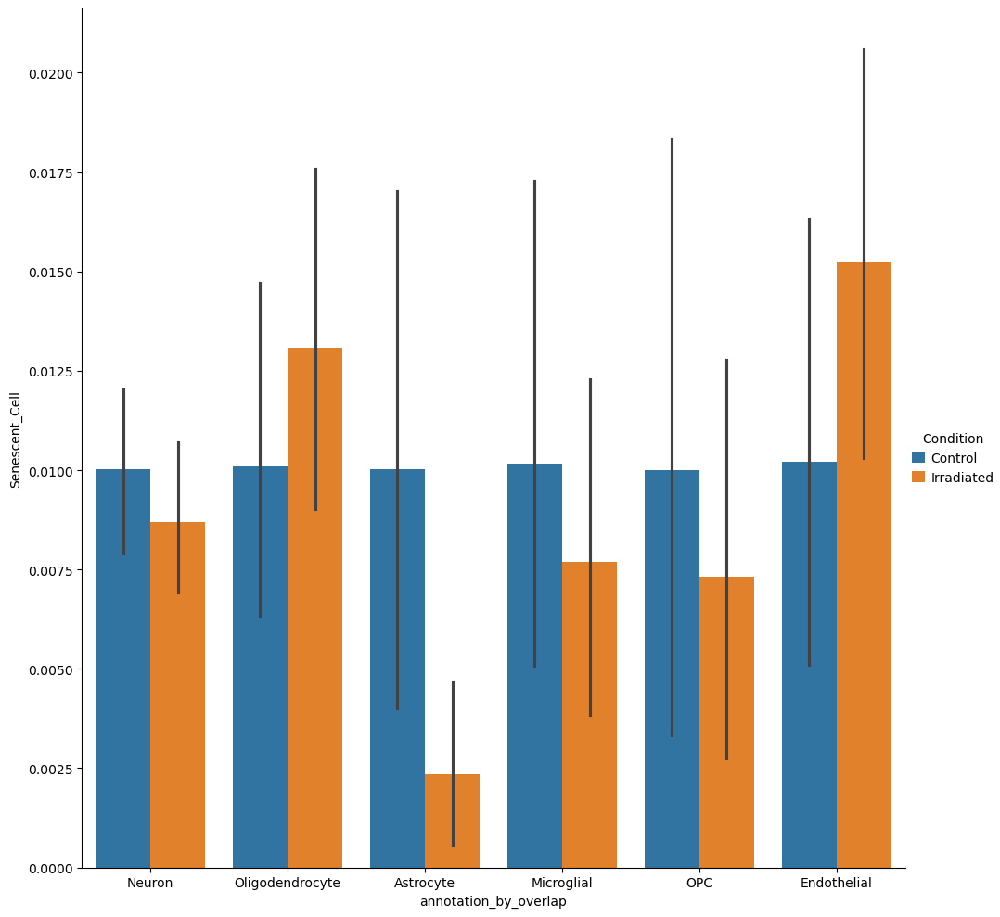

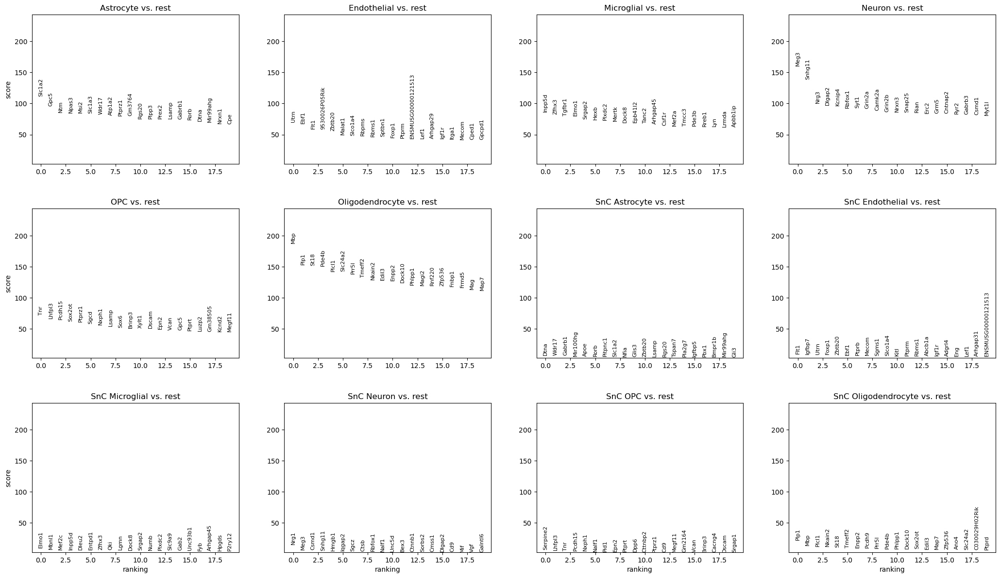

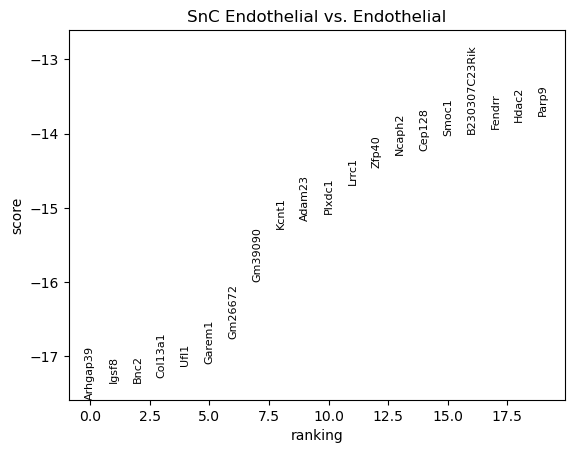

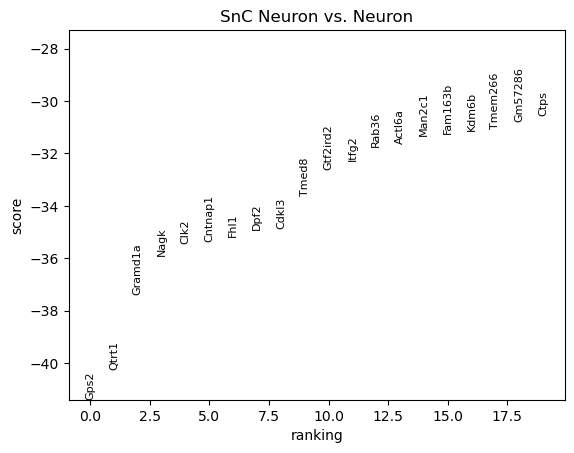

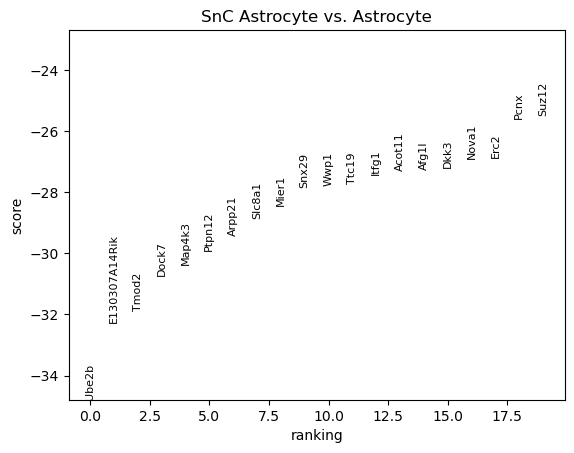

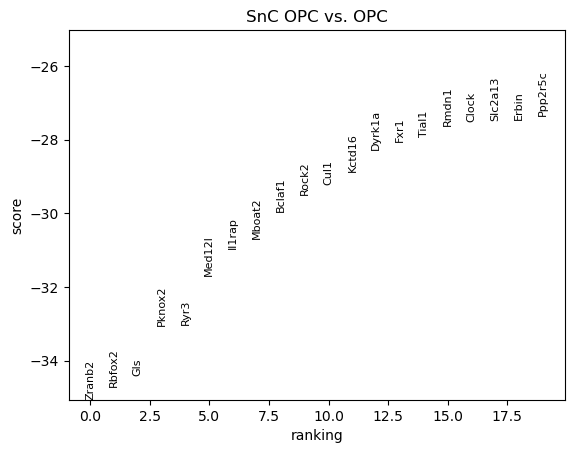

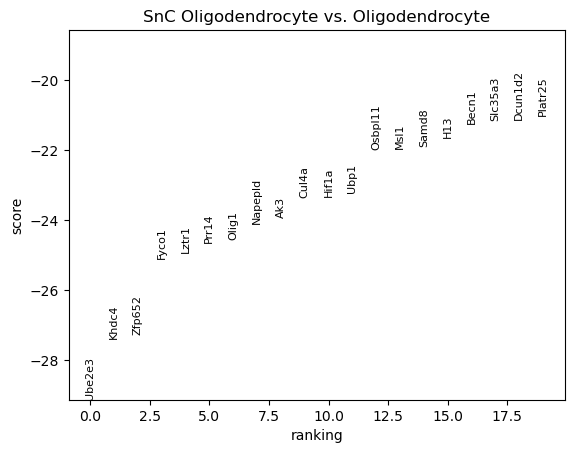

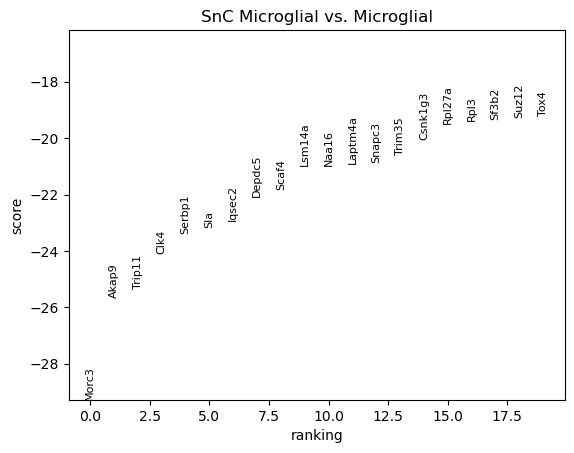

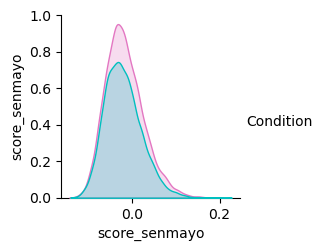

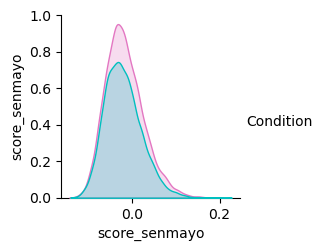

In [15]:
scores = self.rna.obs[[col_batch] + [
    f"score_{x}" for x in sen_metrics]].set_index(
        col_batch, append=True).reset_index()
sns.pairplot(scores, diag_kind="kde", diag_kws=dict(
    cut=0, fill=True, common_norm=True),
             hue=col_batch, palette=palette[col_batch])

## Scores

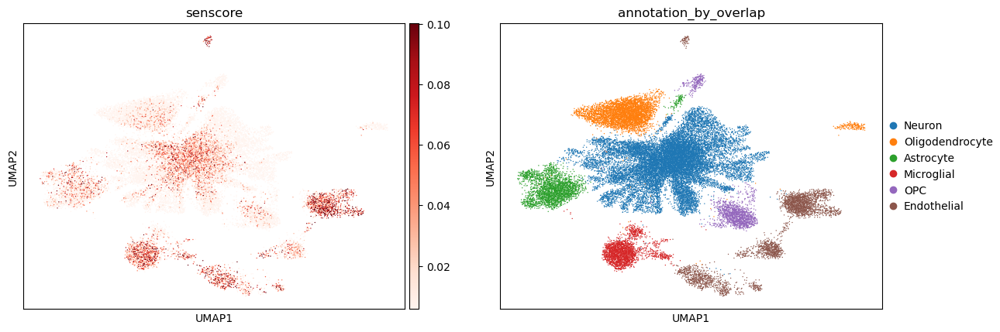

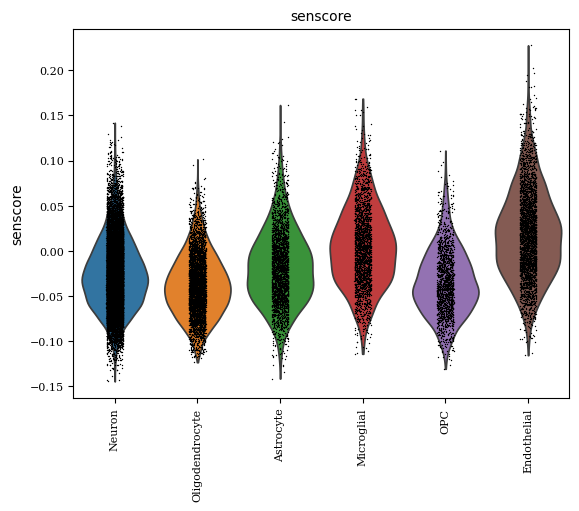

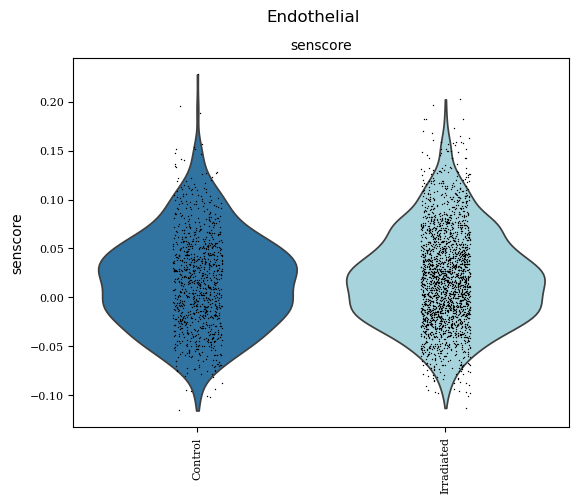

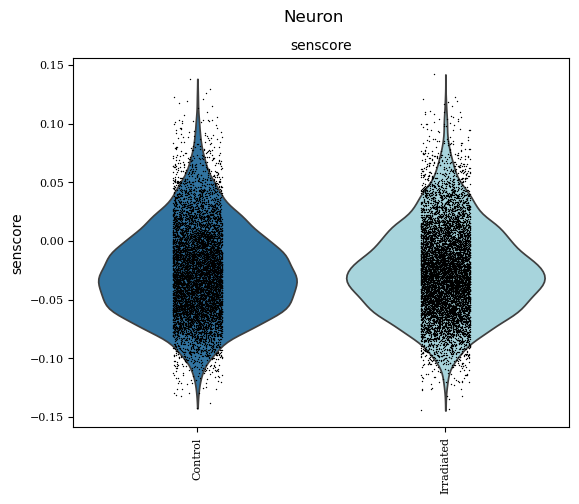

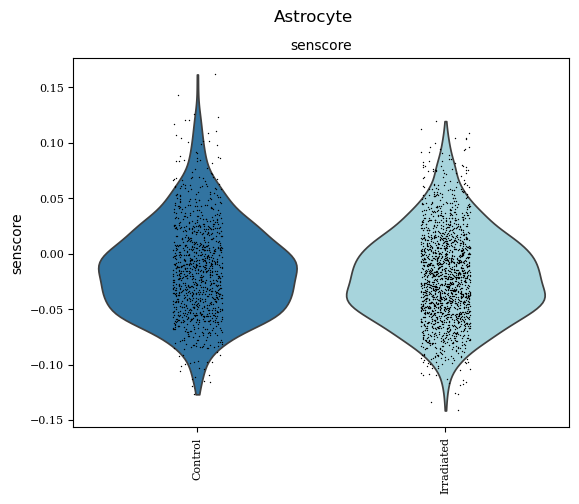

...

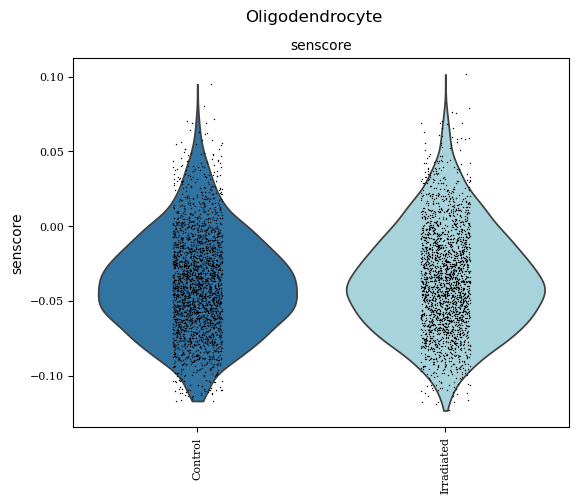

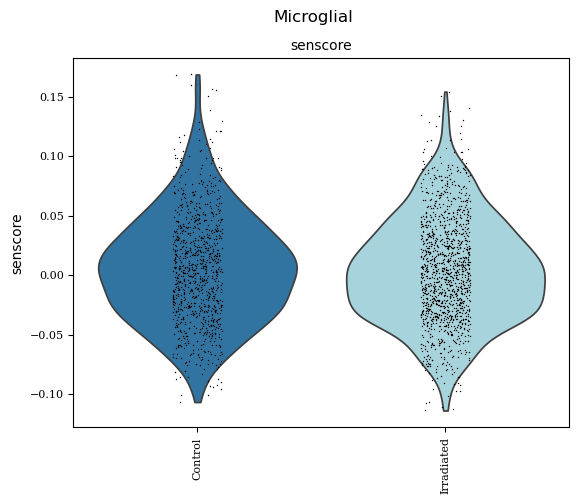

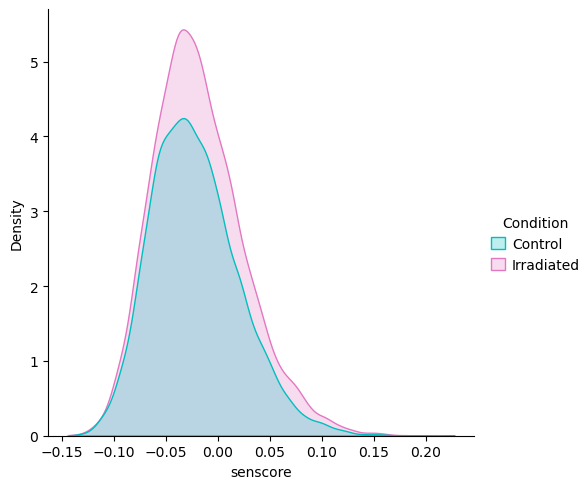

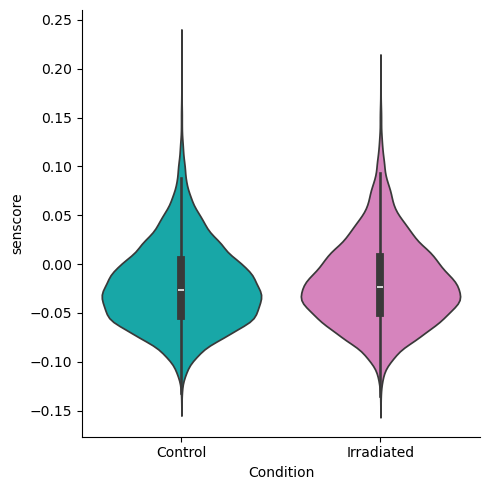

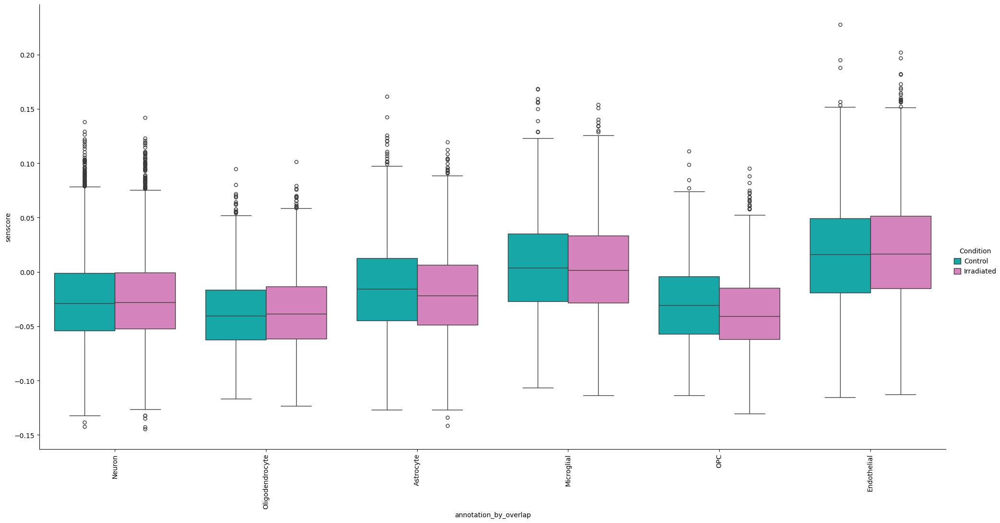

In [ ]:
# UMAP with Senescence Scores
bnds = self.rna.obs["senscore"].describe(percentiles=[0.75, 0.99])
_ = self.plot(kind="umap", color=["senscore", col_celltype], umap=dict(
    palette=None, color_map="Reds", vmin=bnds["75%"], vmax=bnds["99%"]))

# Violin Plot of Senescence Scores
_ = self.plot(kind="violin", genes=["senscore"], common_norm=True,
              col_celltype=col_celltype, rotation=90)
_ = self.plot(kind="violin", genes=["senscore"], common_norm=True,
              by_group=col_celltype, col_wrap=1,
              col_celltype=col_batch, rotation=90)

# KDE
fig_sen_kde = sns.displot(self.rna.obs, hue=col_condition, x="senscore",
                          palette=palette[col_condition], kind="kde",
                          cut=0, common_norm=True, fill=True)

# Overall (All Cell Types)
fig_sen_overall = sns.catplot(self.rna.obs, x=col_condition,
                              hue=col_condition, y="senscore",
                              palette=palette[col_condition],
                              kind="violin")

# By Cell Type
fig_sen = sns.catplot(self.rna.obs, x=col_celltype, y="senscore",
                      palette=palette[col_condition],
                      hue=col_condition, kind="box", height=10, aspect=2)
for a in fig_sen.axes.flatten():
    a.tick_params(axis="x", labelrotation=90)

## Burden 

Group by sample and cell type and get percentage of senescent cells

annotation_by_overlap,Neuron,Oligodendrocyte,Astrocyte,Microglial,OPC,Endothelial
Condition,,,,,,
Control,1.00,1.01,1.00,1.02,1.00,1.02
Irradiated,0.87,1.31,0.23,0.77,0.73,1.52




             min  25%  50%  75%  max
Condition                          
Control     1.0  1.0  1.0  1.0  1.0
Irradiated  0.2  0.7  0.8  1.2  1.5



Percent Cells Senescent


annotation_by_overlap,Neuron,Oligodendrocyte,Astrocyte,Microglial,OPC,Endothelial
Condition,,,,,,
Control,1.00,1.01,1.00,1.02,1.00,1.02
Irradiated,0.87,1.31,0.23,0.77,0.73,1.52


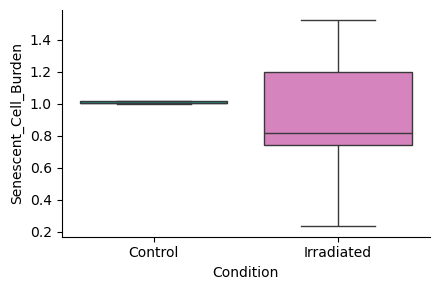

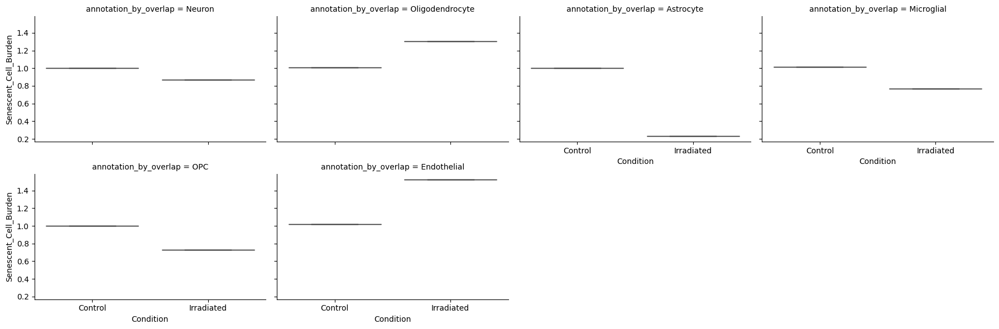

In [40]:
grps = [col_condition, col_celltype, "Senescent_Cell"]
dff = self.rna.obs[grps].groupby(grps[:-1]).apply(
    lambda x: x["Senescent_Cell"].mean(), include_groups=False
    ).to_frame("Senescent_Cell_Burden") * 100
# kws_plot = dict(kind="violin", split=False, , common_norm=True)
kws_plot = dict(kind="box", errorbar=("ci", 95))

sns.catplot(y="Senescent_Cell_Burden", x=col_condition, **kws_plot,
            palette=palette[col_condition],
            hue=col_condition, data=dff, height=3, aspect=1.5)
sns.catplot(y="Senescent_Cell_Burden", x=col_condition, **kws_plot,
            col=col_celltype, col_wrap=4,
            palette=palette[col_condition],
            hue=col_condition, data=dff, height=3, aspect=1.5)
print("\n\n", round(dff["Senescent_Cell_Burden"].groupby(
    col_condition).describe()[["min", "25%", "50%", "75%", "max"]], 1))
print(f"\n\n\n{'=' * 80}\nPercent Cells Senescent\n{'=' * 80}")
round(100 * self.rna.obs.groupby([col_condition, col_celltype]).value_counts(
    ["Senescent_Cell_Label"], normalize=True).unstack(-1), 2)[
        "Senescent"].unstack(1)

## Differential Gene Expression

Mainly using `edgeR`

### Pseudo-Bulk & Examine Covariates

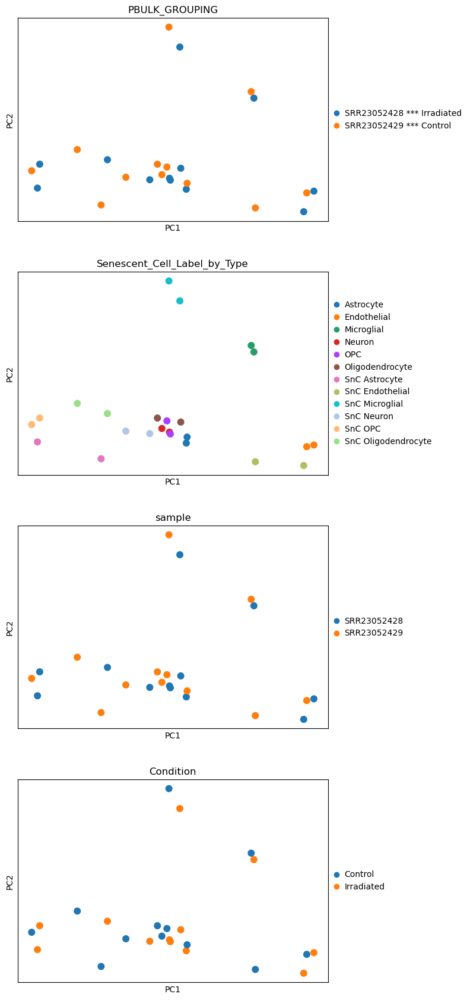

In [42]:
pdata = scflow.tl.create_pseudobulk(
    self.rna, [i for i in [col_sample, col_condition] if i],
    "Senescent_Cell_Label_by_Type", layer="counts", mode="sum")
pdata.layers["counts"] = pdata.X.copy()
sc.pp.normalize_total(pdata, target_sum=1e6)
sc.pp.log1p(pdata)
sc.pp.pca(pdata)
sc.pl.pca(pdata, color=pdata.obs, ncols=1, size=300)

### Overall DEGs by Groups

• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model


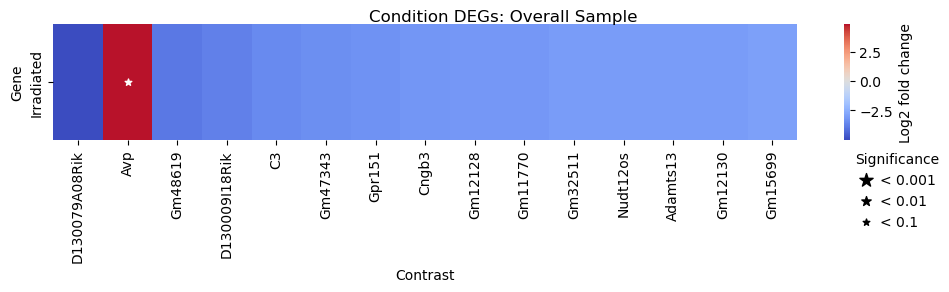

In [50]:
%matplotlib inline

out_edgr = scflow.ax.run_deg_edgr(
    self.rna, col_condition, col_covariate=None, formula=None,
    **keys[col_condition], log2fc_thresh=0, n_top_vars=25,
    col_celltype=col_celltype, col_sample=col_sample,
    fig_title=f"{col_condition} DEGs: Overall Sample\n\n")

### Snc versus Not (Group=Covariate)

• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Performing pseudobulk for paired samples


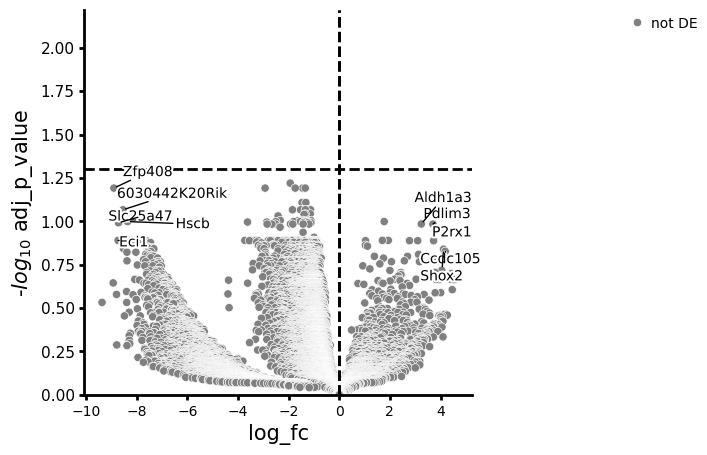

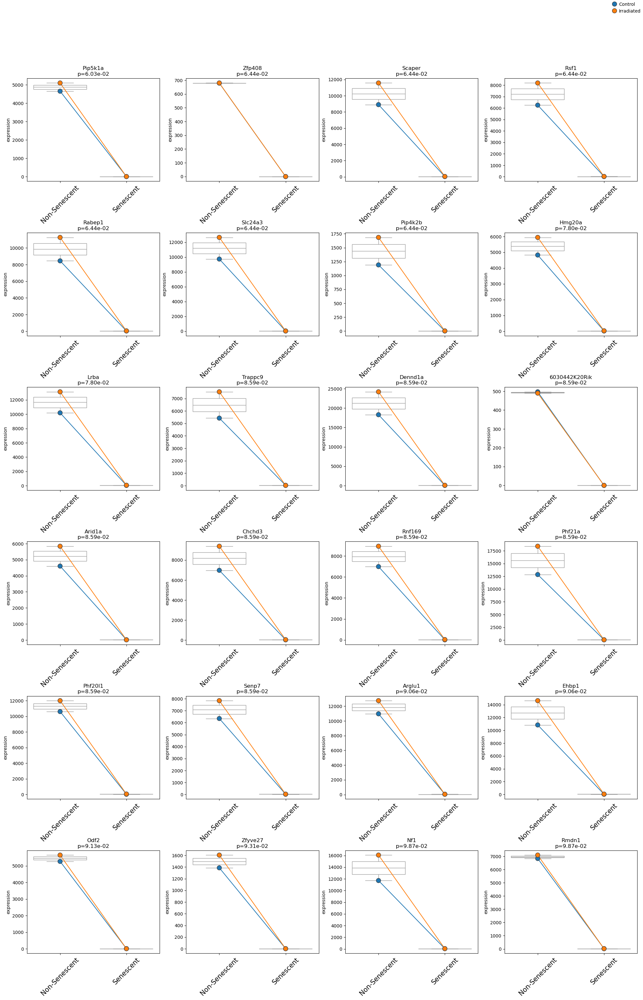

In [44]:
# Group = Covariate
out_edgr_contrasts_snc = scflow.ax.run_deg_edgr(
    self.rna, "Senescent_Cell_Label",
    col_covariate=col_condition, formula=None,
    key_treatment="Senescent", key_control="Non-Senescent",
    log2fc_thresh=0, n_top_vars=24, xlabel_rotation=45,
    hspace=0.5, wspace=0.2, top=0.92, legend_loc="upper right",
    col_celltype=col_celltype, col_sample=col_sample)

### Group DEGs (SnC=Subset)

##### All Groups SnCs

• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
• Calculating NormFactors
• Estimating Dispersions
• Fitting linear model
['Rgs5', 'Gm29260', 'Alk', 'Acta2', 'Tpm2', 'Phf21b', 'Cavin1', 'Gm12394', 'Ifitm2', 'Mideas', 'Ginm1', 'Tbx15', 'Trpc3', 'Tinagl1', 'Adgrv1', 'Slc1a4', 'Mapk8ip2', 'Zfp804b', 'Lbh', 'Gm973', 'Zfp653', 'Sec13', 'Wdr91', 'Dpysl3', 'Aldh1a3']


/tmp/ipykernel_857868/3587666276.py:10: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  out_edgr_batches_top_snc = out_edgr_batches_snc.groupby("contrast").apply(


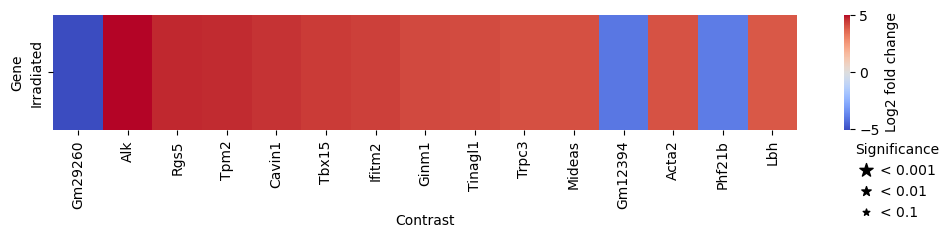

In [47]:
out_edgr_groups_snc = scflow.ax.run_deg_edgr(
    self.rna[(self.rna.obs["Senescent_Cell_Label"] == "Senescent")],
    col_condition, **keys[col_condition], col_sample=col_sample,
    log2fc_thresh=0, n_top_vars=25, col_celltype=col_celltype)
print(list(out_edgr_groups_snc[0].variable[:25]))
out_edgr_batches_snc = out_edgr_groups_snc[0][(
    out_edgr_groups_snc[0].abs_log_fc > 1) & (
        out_edgr_groups_snc[0].adj_p_value < 0.001)].sort_values(
            "adj_p_value", ascending=True)
out_edgr_batches_top_snc = out_edgr_batches_snc.groupby("contrast").apply(
    lambda x: x.sort_values("adj_p_value", ascending=True).iloc[
        :20]).set_index("variable", append=True).reset_index(
            1, drop=True)
plt.show()

# SnC GEX Profiles

## Pathway Analysis

In [48]:
names = gp.get_library_name()
# perts_geo = ["Aging", "Drug", "Disease"]
perts_geo = ["Aging", "Disease"]
other_sets = ["GTEx_Aging_Signatures_2021", f"HDSigDB_{species}_2021",
              "MSigDB_Hallmark_2020",  # "DGIdb_Drug_Targets_2024",
              "MSigDB_Oncogenic_Signatures", "OMIM_Disease",
              # "Reimport pdb;actome_Pathways_2024", "Reactome_2022",
              f"WikiPathways_2024_{species}", f"WikiPathways_2019_{species}"]
other_sets += [i for i in names if "GO_Biological_Process" in i]
gene_sets = dict(zip(["up", "down"], [[
    f"{u}_Perturbations_from_GEO_{i}" for u in perts_geo] + [
        f"Disease_Signatures_from_GEO_{i}_2014"] + other_sets
    for i in ["up", "down"]]))


def fx_replace_string(string):
    """Make short version of pathway terms."""
    string = re.sub("aging:([0-9]+)", "aging", re.sub(
        "([0-9]+) months v ([0-9]+) mo(nths)?", "\\1 v \\2 mo.", re.sub(
            "SRP[0-9]+ ", "", re.sub("GSE[0-9]+ ", "", string))))
    string = re.sub(".*.xlsx.", "", re.sub(
        ".*Supplementary Data ..", "", re.sub(
            "PMID([0-9])+", "", re.sub("([0-9]+) years v ([0-9]+) years",
                                       "\\1 v \\2 yrs.", string))))
    string = re.sub("Expression Of ", "", re.sub(".*.xls", "", re.sub(
        ".*.XLSX", "", re.sub(
            ".*Supplementary Table [0-9]+[-]?", "", string))))
    return string

### Endrichr

/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/gseapy/plot.py:754: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda _x: _x.sort_values(by=self.colname).tail(self.n_terms))
/home/easlinger/miniconda3/envs/rsc/lib/python3.13/site-packages/gseapy/plot.py:754: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda _x: _x.sort_values(by=self.colname).tail(self.n_terms))
/home/ea

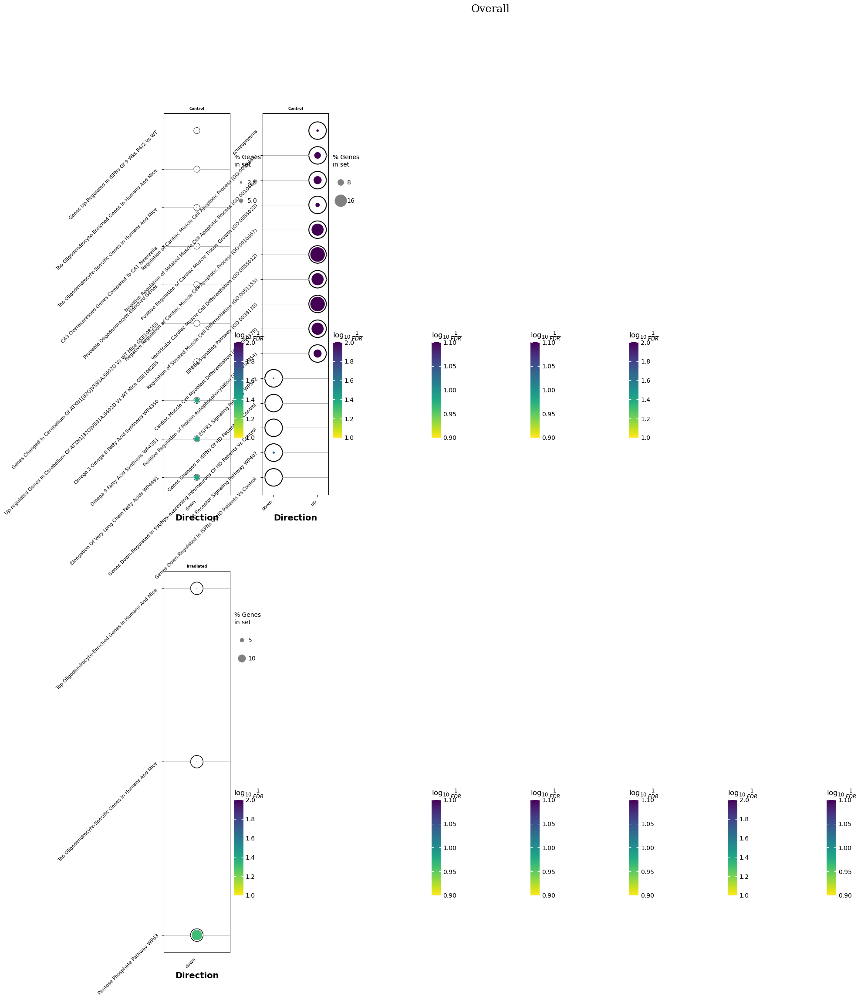

In [59]:
out_pathway_snc_edgr_contrasts = scflow.ax.run_enrichr(
    res_rank_genes_top, col_grouping=[col_condition, col_celltype],
    gene_sets=gene_sets, fx_replace_string=fx_replace_string, title="Overall")

### SnC vs. Not

In [ ]:
# res_dc_ulm = scflow.ax.run_decoupler_ulm(
#         self.rna[self.rna.obs["Senescent_Cell_Label"] == "Senescent"],
#         # "Senescent_Cell_Label_by_Type",
#         # "Senescent_Cell_Label",
#         col_condition, col_condition="Senescent_Cell_Label_by_Type",
#         species=species, resource="hallmark",
#         top=0.95, hspace=1, wspace=0.5, figsize=(15, 10))

#### Pathway Set = Progeny

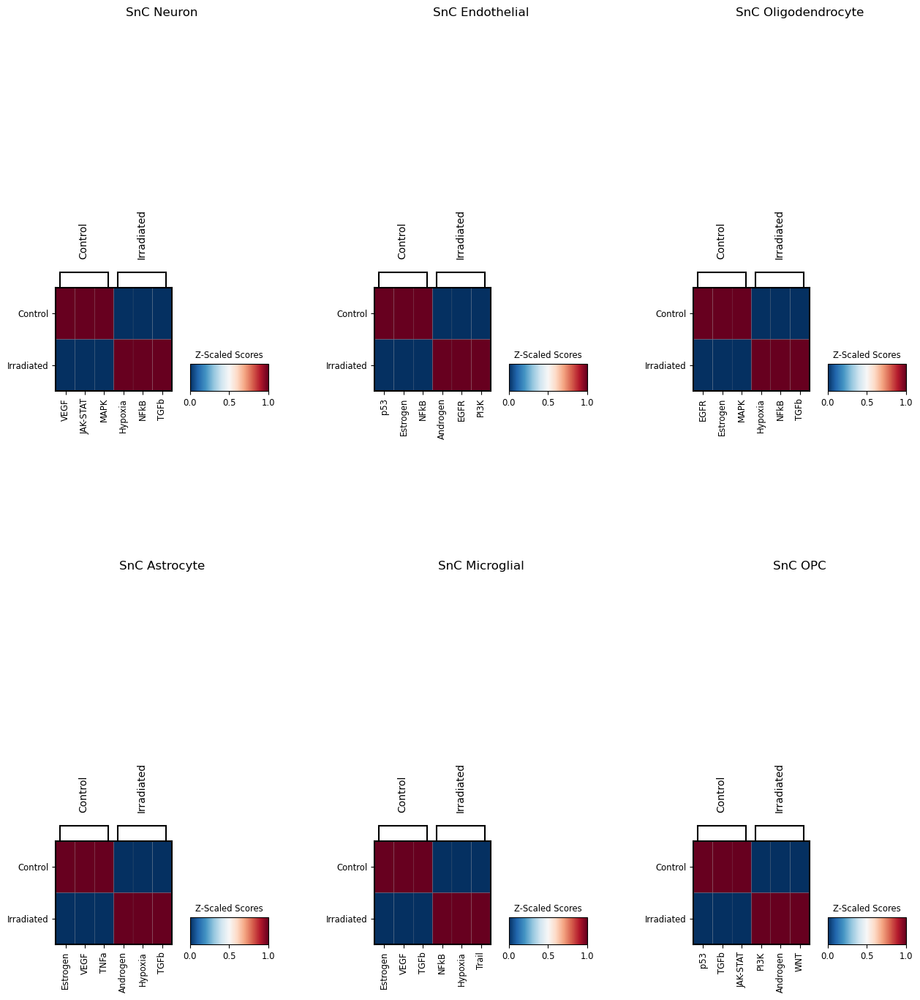

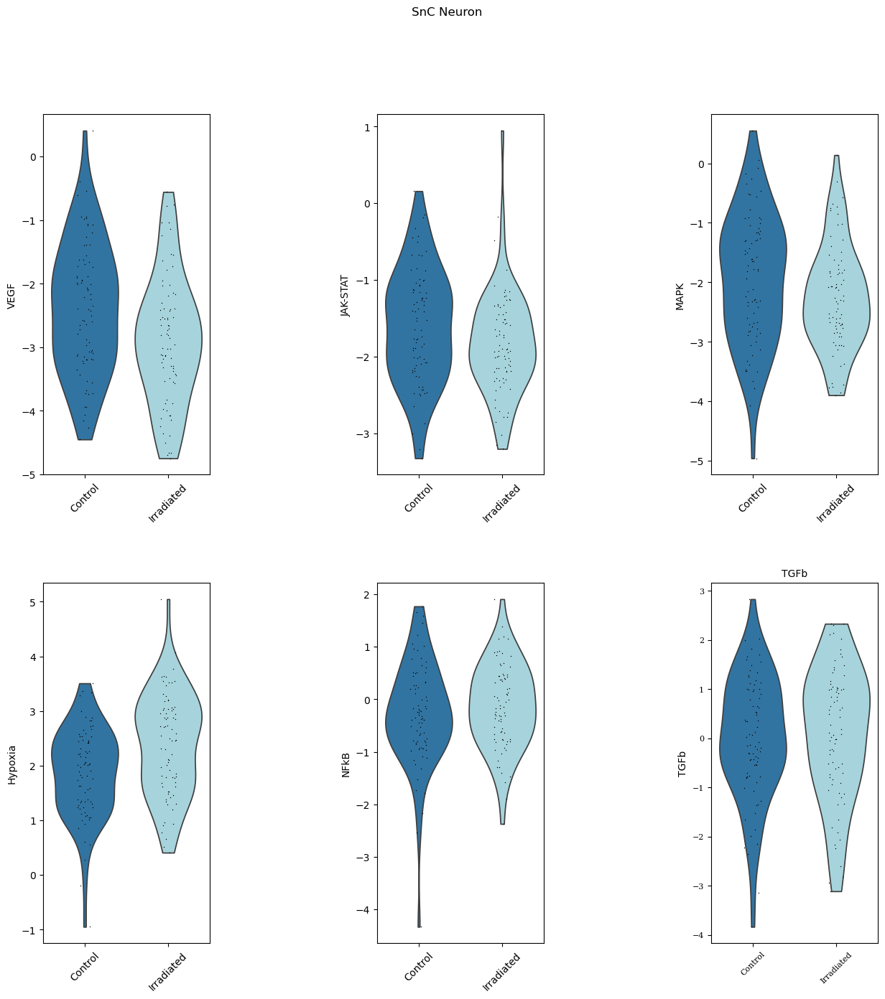

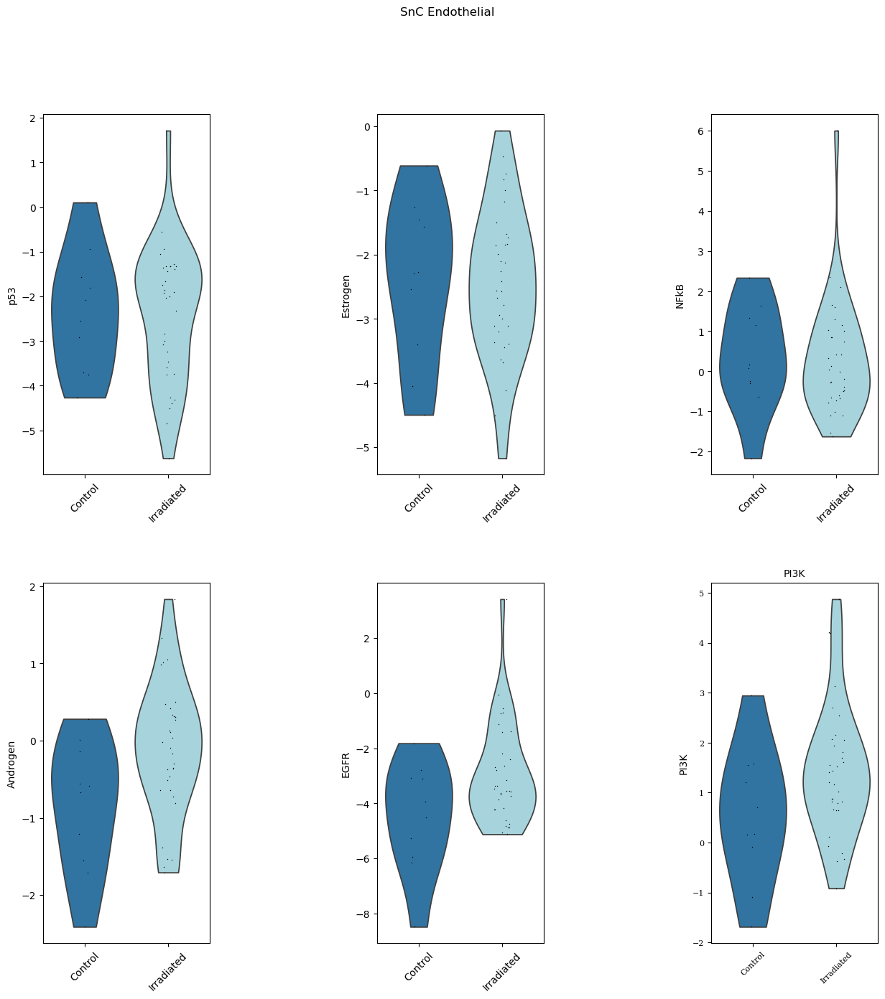

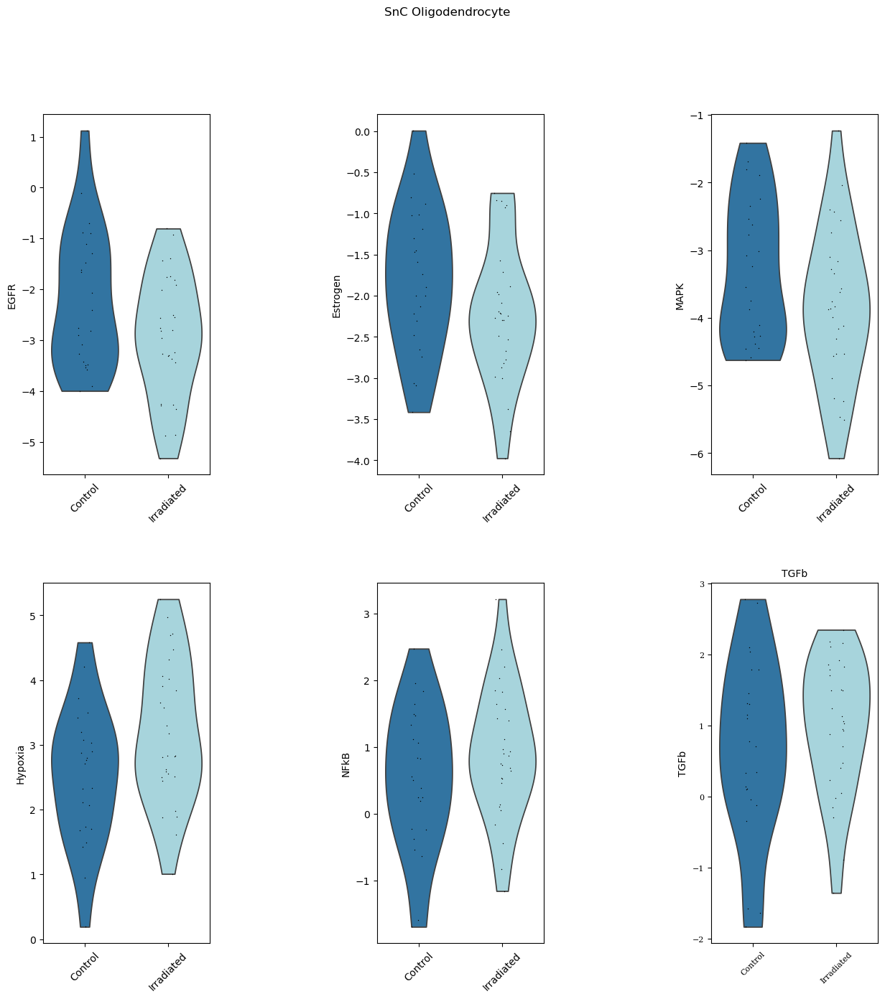

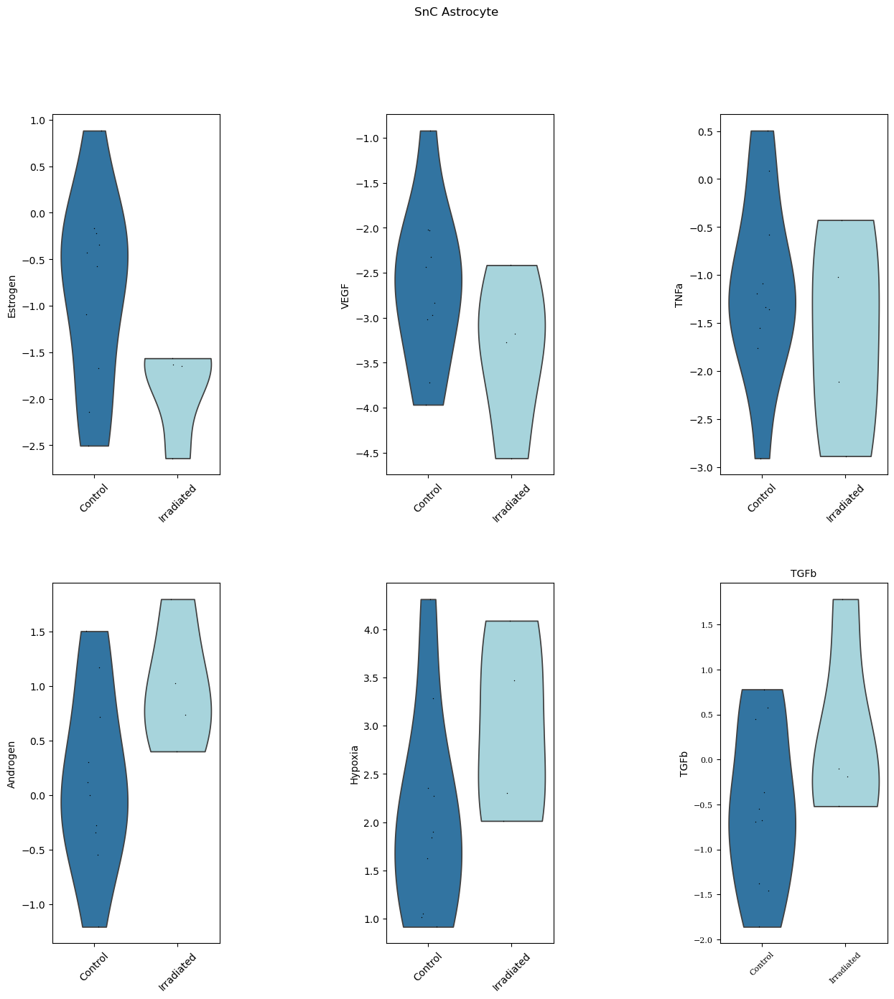

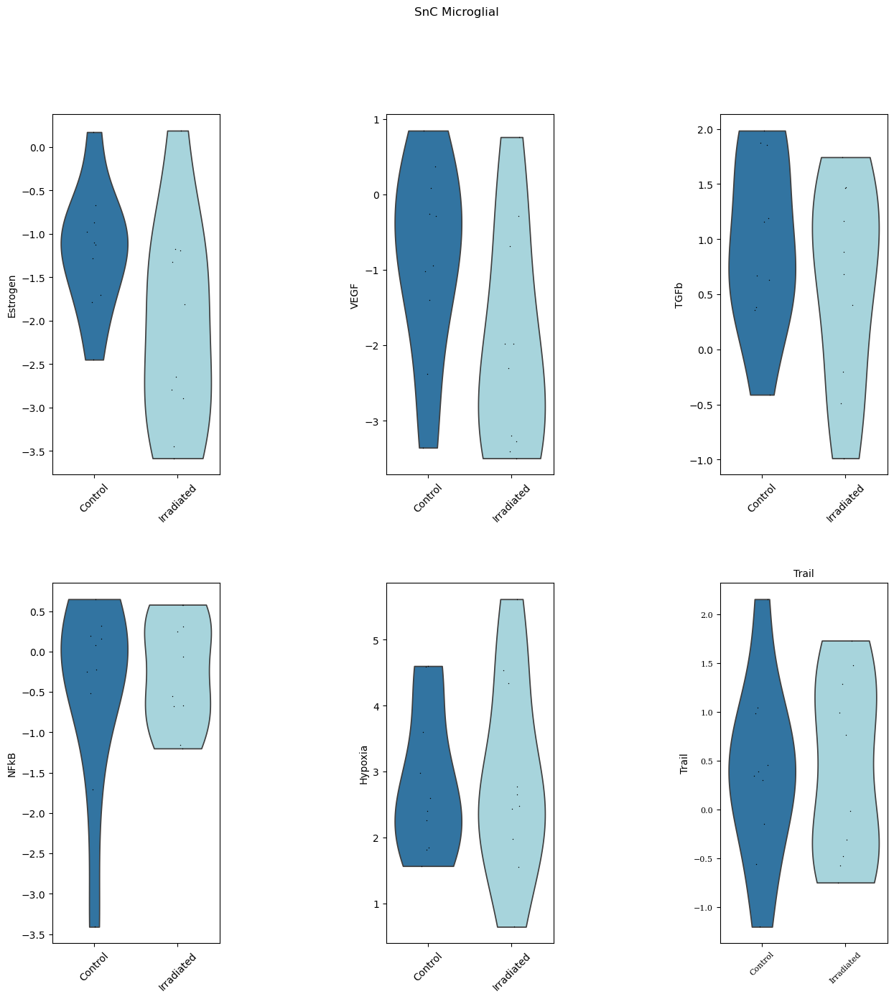

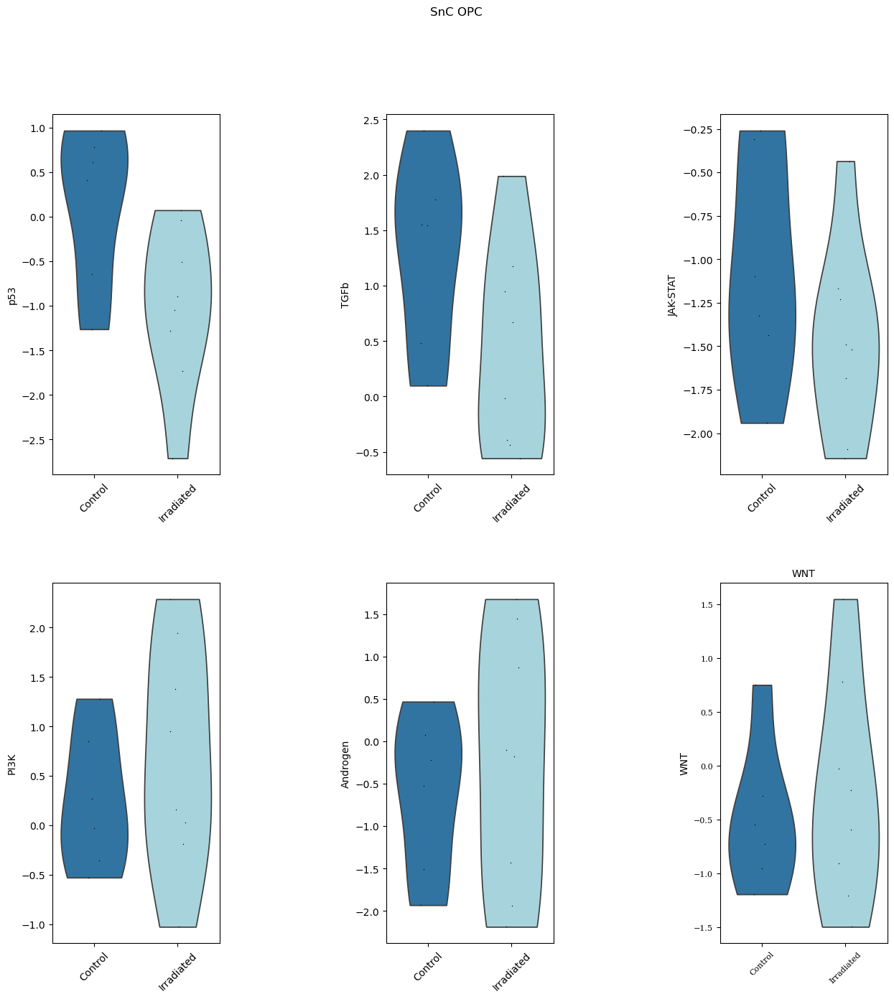

SnC Neuron           Control          [VEGF, JAK-STAT, MAPK]
                     Irradiated        [Hypoxia, NFkB, TGFb]
SnC Endothelial      Control           [p53, Estrogen, NFkB]
                     Irradiated       [Androgen, EGFR, PI3K]
SnC Oligodendrocyte  Control          [EGFR, Estrogen, MAPK]
                     Irradiated        [Hypoxia, NFkB, TGFb]
SnC Astrocyte        Control          [Estrogen, VEGF, TNFa]
                     Irradiated    [Androgen, Hypoxia, TGFb]
SnC Microglial       Control          [Estrogen, VEGF, TGFb]
                     Irradiated       [NFkB, Hypoxia, Trail]
SnC OPC              Control           [p53, TGFb, JAK-STAT]
                     Irradiated        [PI3K, Androgen, WNT]
dtype: object


reference      stat  meanchange      pval      padj
annotation_by_overlap Condition  name                                                        
SnC Neuron            Irradiated Hypoxia       rest  3.701982    0.517813  0.000299  0.004187
                                 NFkB          rest  0.979215    0.139662  0.329062  0.772141
                                 TGFb          rest  0.395513    0.081530  0.693015  0.831596
                                 PI3K          rest  0.349796    0.051773  0.726971  0.831596
                                 Androgen      rest  0.174286    0.033017  0.861870  0.861870
                      Control    VEGF          rest  3.167398    0.507750  0.001847  0.012926
                                 JAK-STAT      rest  2.198900    0.243921  0.029356  0.136994
                                 MAPK          rest  2.028440    0.316600  0.044268  0.154939
                                 Estrogen      rest  0.987773    0.147316  0.324774  0.757807
                                 EGFR          rest  0.814962    0.140238  0.416412  0.787098
                                 Trail         rest  0.757710    0.107812  0.449770  0.787098
                                 WNT           rest  0.556827    0.079187  0.578441  0.828548
                                 TNFa          rest  0.330969    0.048407  0.741124  0.828548
                                 p53           rest  0.293715    0.062321  0.769366  0.828548
SnC Endothelial       Irradiated Androgen      rest  3.584758    0.741641  0.000641  0.008969
                                 EGFR          rest  3.338697    1.540799  0.001392  0.009747
                                 PI3K          rest  2.717368    0.883364  0.008397  0.039188
                                 MAPK          rest  2.048619    0.879384  0.044514  0.155801
                                 TGFb          rest  1.753021    0.685747  0.085009  0.238026
                                 WNT           rest  1.119968    0.211939  0.266831  0.622605
                                 Trail         rest  0.625223    0.133255  0.533996  0.969301
                                 Hypoxia       rest  0.497972    0.163011  0.620173  0.969301
                                 VEGF          rest  0.416077    0.140420  0.678711  0.969301
                                 TNFa          rest  0.183838    0.061991  0.854717  0.969301
                                 JAK-STAT      rest  0.034260    0.011252  0.972775  0.972775
                      Control    p53           rest  0.084343    0.054280  0.933724  0.985383
                                 Estrogen      rest  0.082409    0.044673  0.935236  0.985383
                                 NFkB          rest  0.068369    0.041923  0.946251  0.985383
SnC Oligodendrocyte   Irradiated Hypoxia       rest  2.406802    0.668090  0.019425  0.222454
                                 NFkB          rest  1.396071    0.375785  0.168245  0.471085
                                 TGFb          rest  1.039007    0.306021  0.303608  0.607215
                                 Androgen      rest  0.452552    0.125401  0.652699  0.788823
                                 TNFa          rest  0.419959    0.105349  0.676134  0.788823
                                 p53           rest  0.248027    0.096338  0.805049  0.848433
                      Control    EGFR          rest  1.898794    0.704252  0.063948  0.321328
                                 Estrogen      rest  1.739914    0.428150  0.088575  0.321328
                                 MAPK          rest  1.722135    0.541148  0.091808  0.321328
                                 JAK-STAT      rest  0.948057    0.264930  0.349181  0.699741
                                 Trail         rest  0.752802    0.151900  0.455405  0.783437
                                 PI3K          rest  0.621809    0.163893  0.537138  0.783437
                                 VEGF          rest  0.587736    0.173159  0.559598  0.783437


In [60]:
res_dc_ulm = scflow.ax.run_decoupler_ulm(
        self.rna[self.rna.obs["Senescent_Cell_Label"] == "Senescent"],
        col_condition, col_condition="Senescent_Cell_Label_by_Type",
        species=species, resource="progeny",
        hspace=0.5, wspace=0.5, top=0.95, figsize=(15, 15))
res_dc_ulm_scores = pd.concat([res_dc_ulm[0][x][1].set_index(
    "group").rename_axis(col_condition).set_index(
        "name", append=True) for x in res_dc_ulm[0]],
                              keys=res_dc_ulm[0], names=[col_celltype])
res_dc_ulm_pathways = pd.concat([pd.Series(res_dc_ulm[0][x][2])
                                 for x in res_dc_ulm[0]], keys=res_dc_ulm[0])
print(res_dc_ulm_pathways)
res_dc_ulm_scores

#### Pathway Set = Hallmark

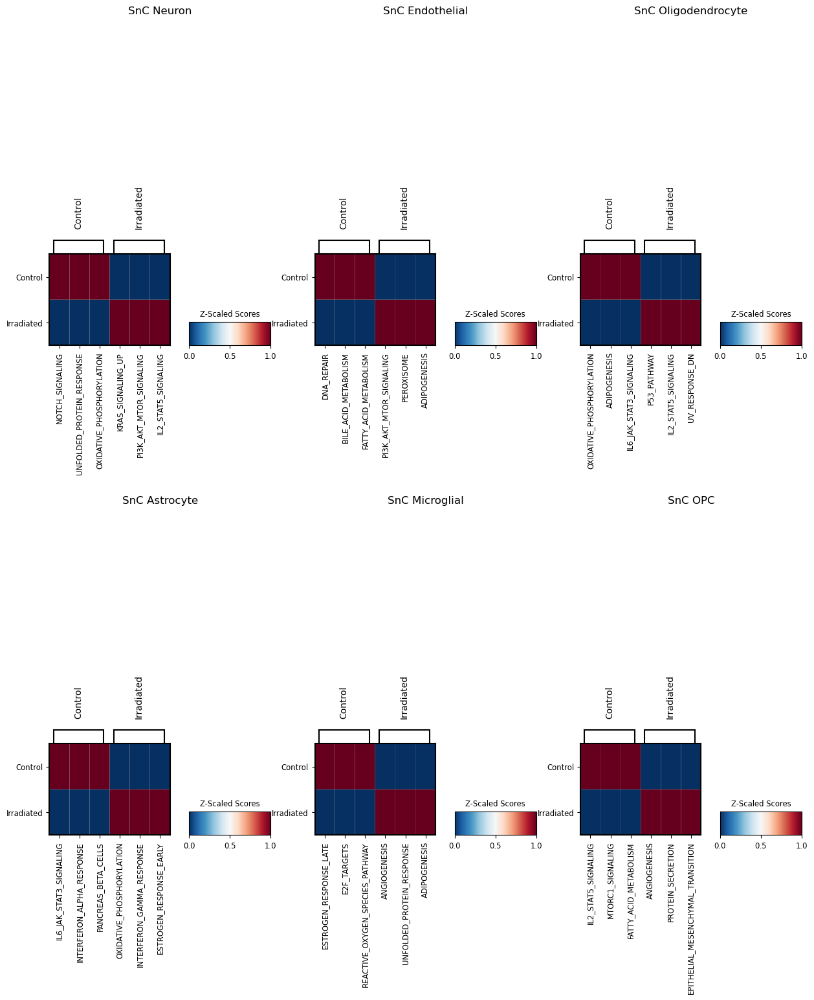

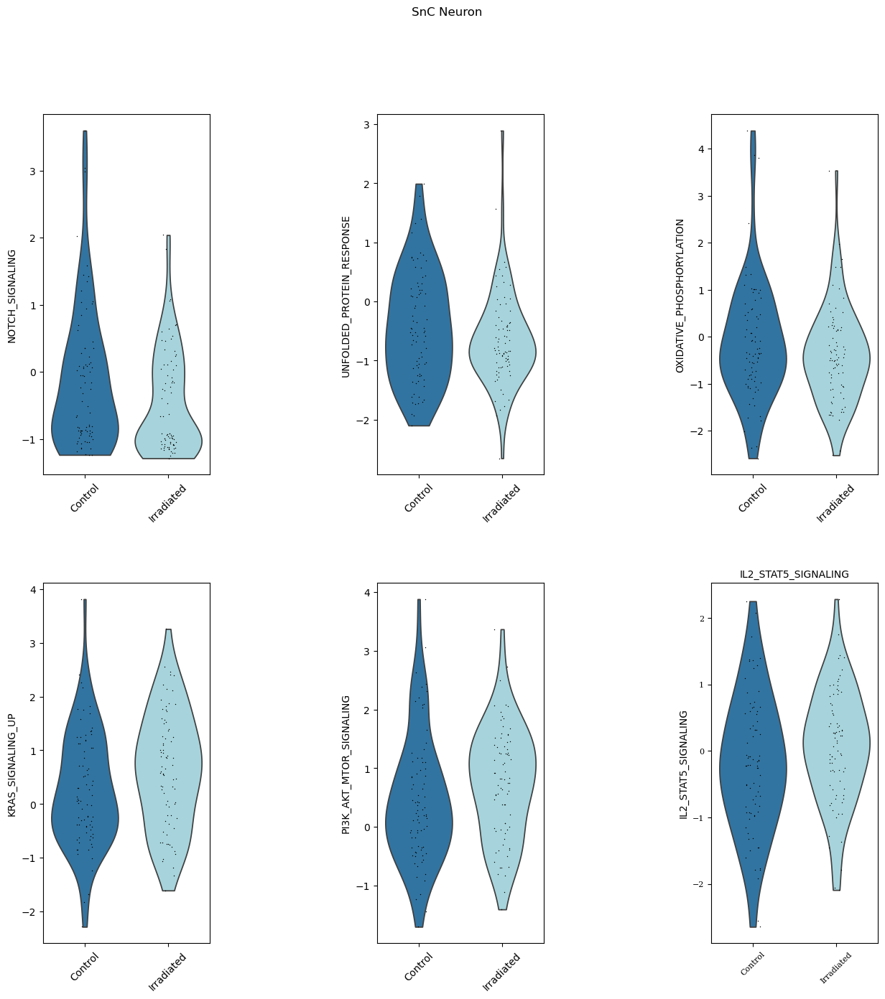

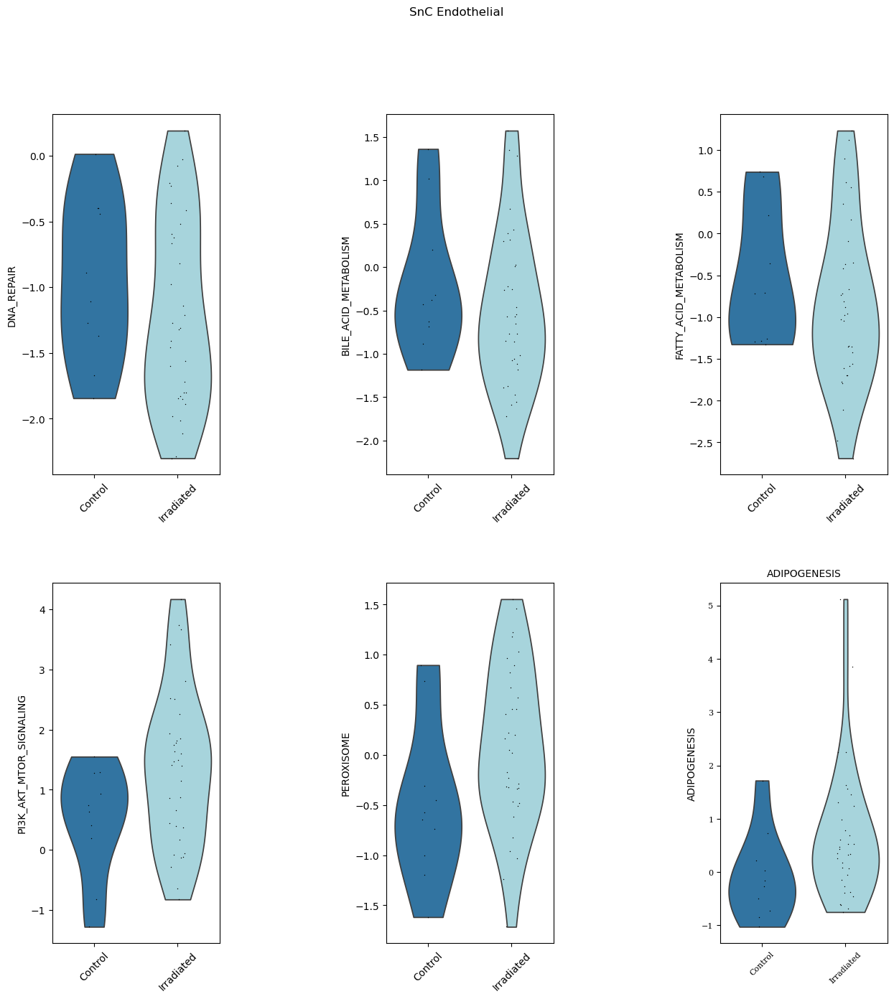

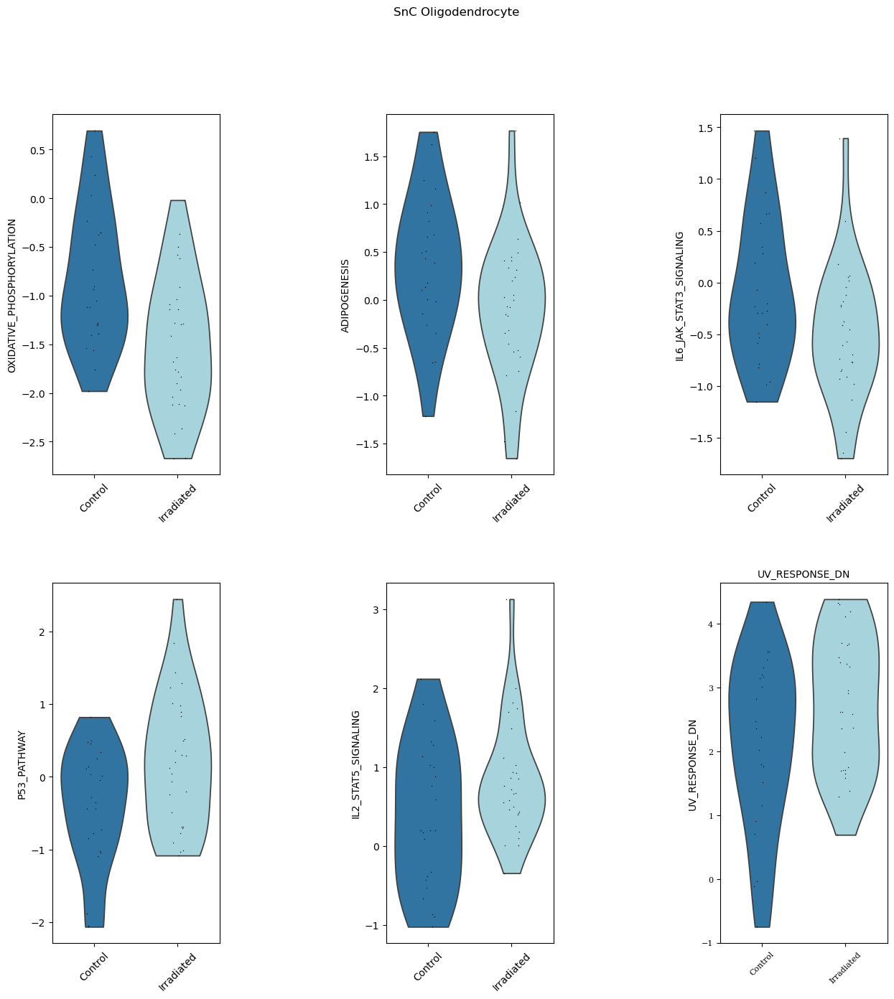

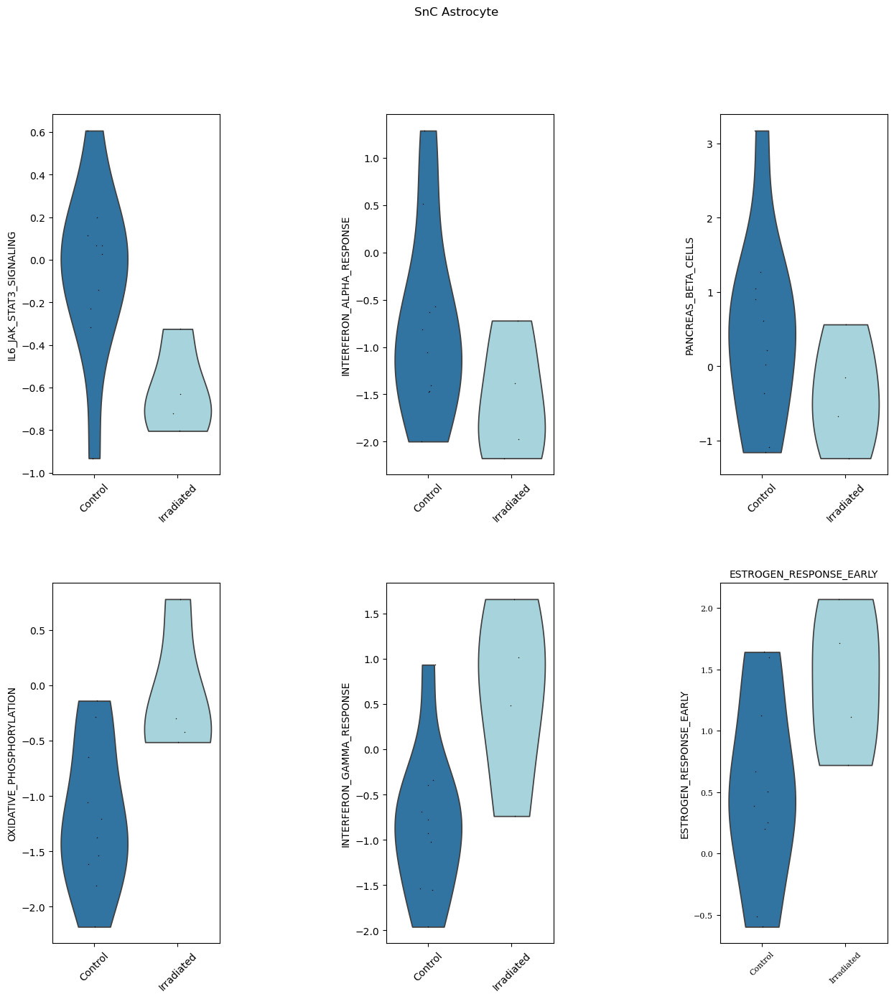

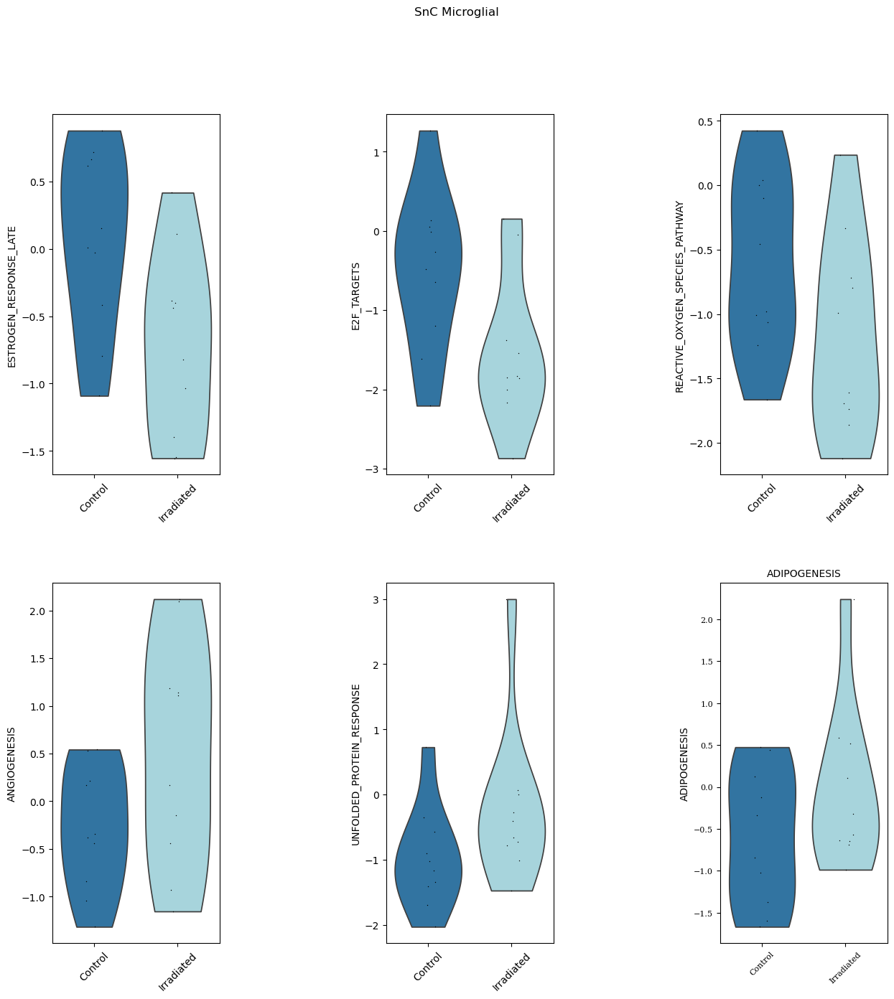

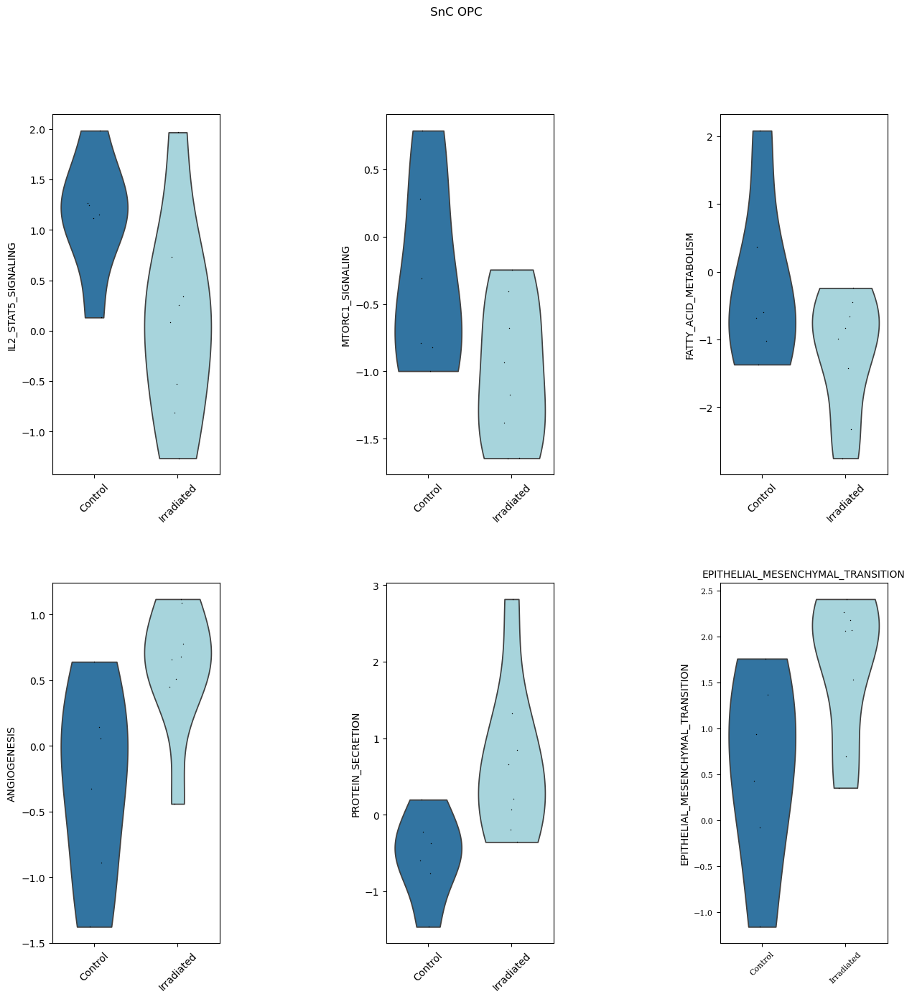

reference      stat  meanchange      pval      padj
annotation_by_overlap Condition  name                                                                                 
SnC Neuron            Irradiated KRAS_SIGNALING_UP                      rest  2.142576    0.364921  0.033719  0.745641
                                 PI3K_AKT_MTOR_SIGNALING                rest  1.808917    0.293497  0.072443  0.745641
                                 IL2_STAT5_SIGNALING                    rest  1.737617    0.261750  0.084334  0.745641
                                 HYPOXIA                                rest  1.716823    0.255888  0.088029  0.745641
                                 KRAS_SIGNALING_DN                      rest  1.522388    0.298502  0.129973  0.745641
                                 APOPTOSIS                              rest  1.520384    0.230356  0.130511  0.745641
                                 APICAL_SURFACE                         rest  1.287556    0.202346  0.199834  0.810858
                                 MYOGENESIS                             rest  1.170915    0.221932  0.243460  0.810858
                                 TGF_BETA_SIGNALING                     rest  1.163868    0.187855  0.246400  0.810858
                                 UV_RESPONSE_DN                         rest  1.110060    0.271976  0.268713  0.810858
                                 REACTIVE_OXYGEN_SPECIES_PATHWAY        rest  1.093943    0.163808  0.275692  0.810858
                                 INFLAMMATORY_RESPONSE                  rest  0.951246    0.170875  0.342970  0.866892
                                 UV_RESPONSE_UP                         rest  0.912739    0.121487  0.362892  0.866892
                                 SPERMATOGENESIS                        rest  0.779272    0.135292  0.437104  0.866892
                                 ALLOGRAFT_REJECTION                    rest  0.756070    0.110154  0.450784  0.866892
                                 APICAL_JUNCTION                        rest  0.563461    0.093268  0.573947  0.956493
                                 FATTY_ACID_METABOLISM                  rest  0.489640    0.068687  0.625111  0.976737
                                 MITOTIC_SPINDLE                        rest  0.358345    0.067090  0.720578  0.983385
                                 PROTEIN_SECRETION                      rest  0.283355    0.047455  0.777287  0.983385
                                 ESTROGEN_RESPONSE_LATE                 rest  0.249911    0.034203  0.802991  0.983385
                                 HEDGEHOG_SIGNALING                     rest  0.159255    0.027786  0.873681  0.983385
                                 INTERFERON_ALPHA_RESPONSE              rest  0.154764    0.017483  0.877211  0.983385
                                 CHOLESTEROL_HOMEOSTASIS                rest  0.053349    0.008544  0.957523  0.983385
                                 GLYCOLYSIS                             rest  0.045131    0.005911  0.964061  0.983385
                      Control    NOTCH_SIGNALING                        rest  2.271308    0.328389  0.024601  0.718386
                                 UNFOLDED_PROTEIN_RESPONSE              rest  1.583880    0.216317  0.115275  0.718386
                                 OXIDATIVE_PHOSPHORYLATION              rest  1.525177    0.276239  0.129309  0.718386
                                 BILE_ACID_METABOLISM                   rest  1.422067    0.177724  0.157028  0.785141
                                 MYC_TARGETS_V2                         rest  1.232390    0.113865  0.219729  0.792944
                                 HEME_METABOLISM                        rest  1.226717    0.181348  0.221754  0.792944
                                 IL6_JAK_STAT3_SIGNALING                rest  0.918259    0.115305  0.359940  0.855803
                                 G2M_CHECKPOINT                         rest  0.897914    0.157923  0.370601  0.855803
                     

In [61]:
res_dc_ulm_hm = scflow.ax.run_decoupler_ulm(
        self.rna[self.rna.obs["Senescent_Cell_Label"] == "Senescent"],
        col_condition, col_condition="Senescent_Cell_Label_by_Type",
        species=species, resource="hallmark",
        hspace=0.5, top=0.95, figsize=(15, 15))
res_dc_ulm_hm_scores = pd.concat([res_dc_ulm_hm[0][x][1].set_index(
    "group").rename_axis(col_condition).set_index(
        "name", append=True) for x in res_dc_ulm_hm[0]],
                                 keys=res_dc_ulm_hm[0], names=[col_celltype])
res_dc_ulm_hm_scores

### Individual Cell Scores

2025-09-04 14:47:24 | [INFO] aucell - Running aucell
2025-09-04 14:47:24 | [INFO] Extracted omics mat with 31446 rows (observations) and 23253 columns (features)
2025-09-04 14:47:24 | [INFO] Network has 14771 unique features and 14 unique sources
2025-09-04 14:47:24 | [INFO] aucell - calculating 14 AUCs for 23253 targets across 31446 observations, categorizing features at rank=1163


  0%|          | 0/31446 [00:00<?, ?it/s]

2025-09-04 14:47:35 | [INFO] aucell - done


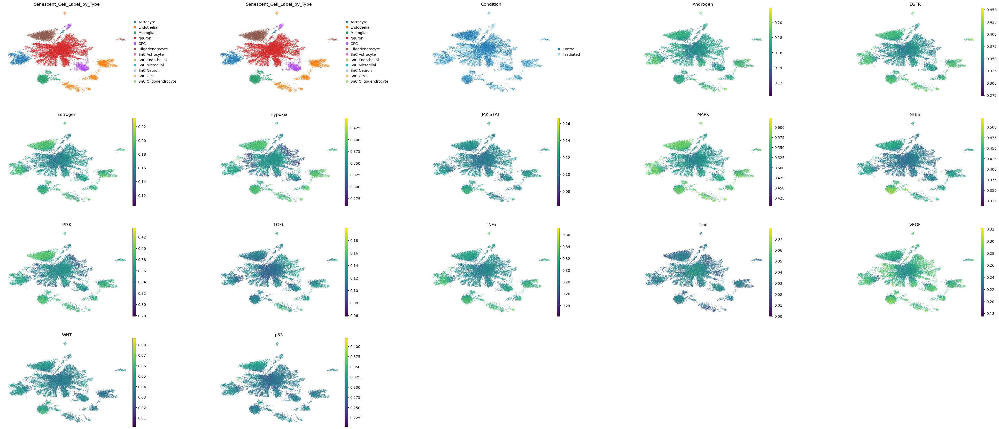

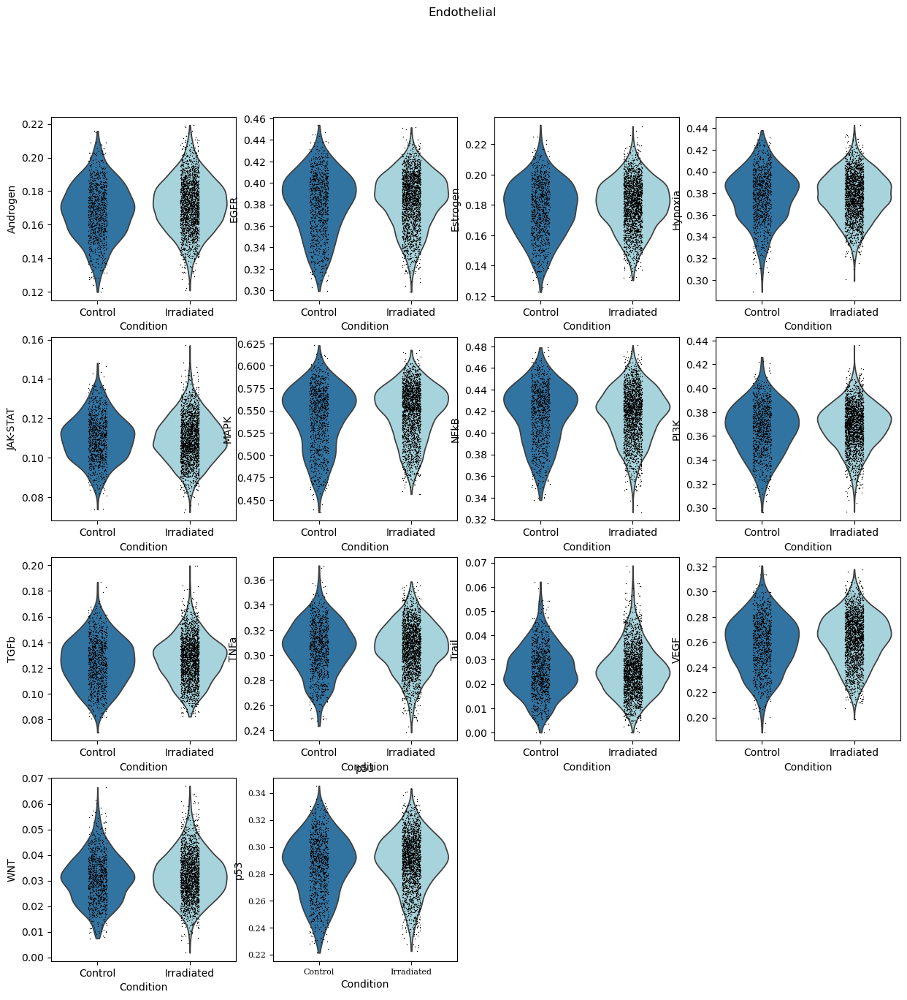

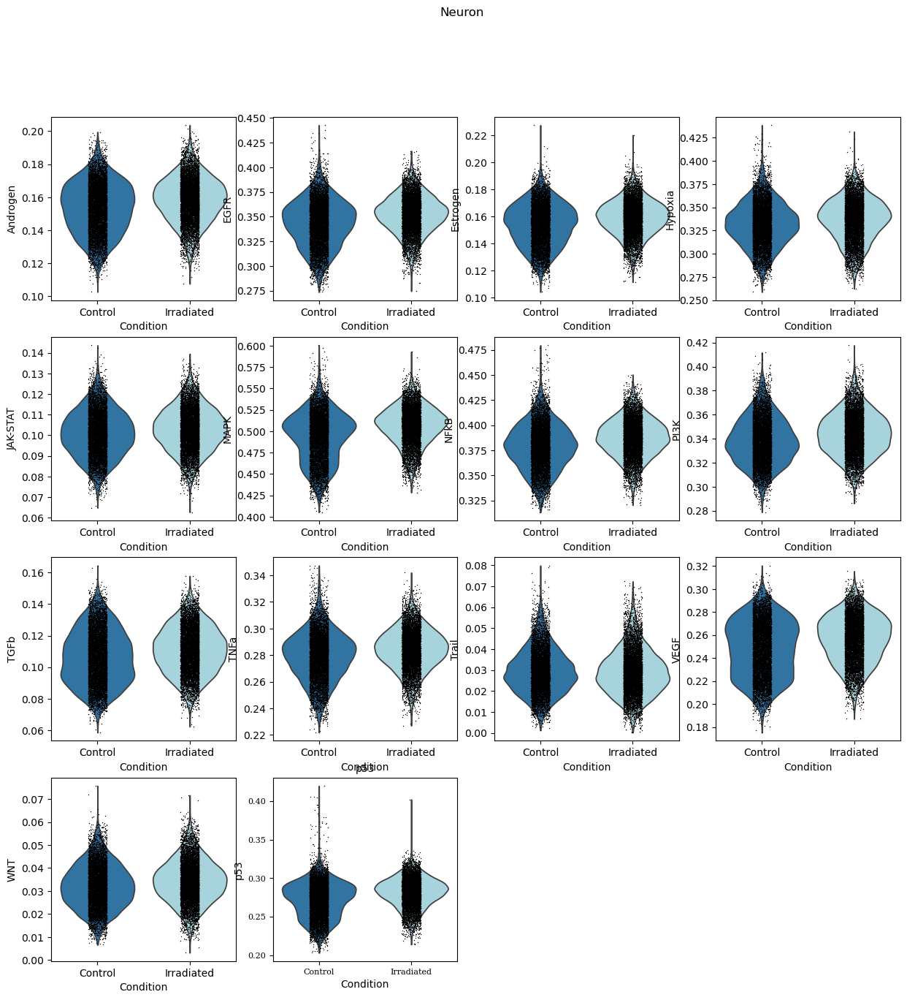

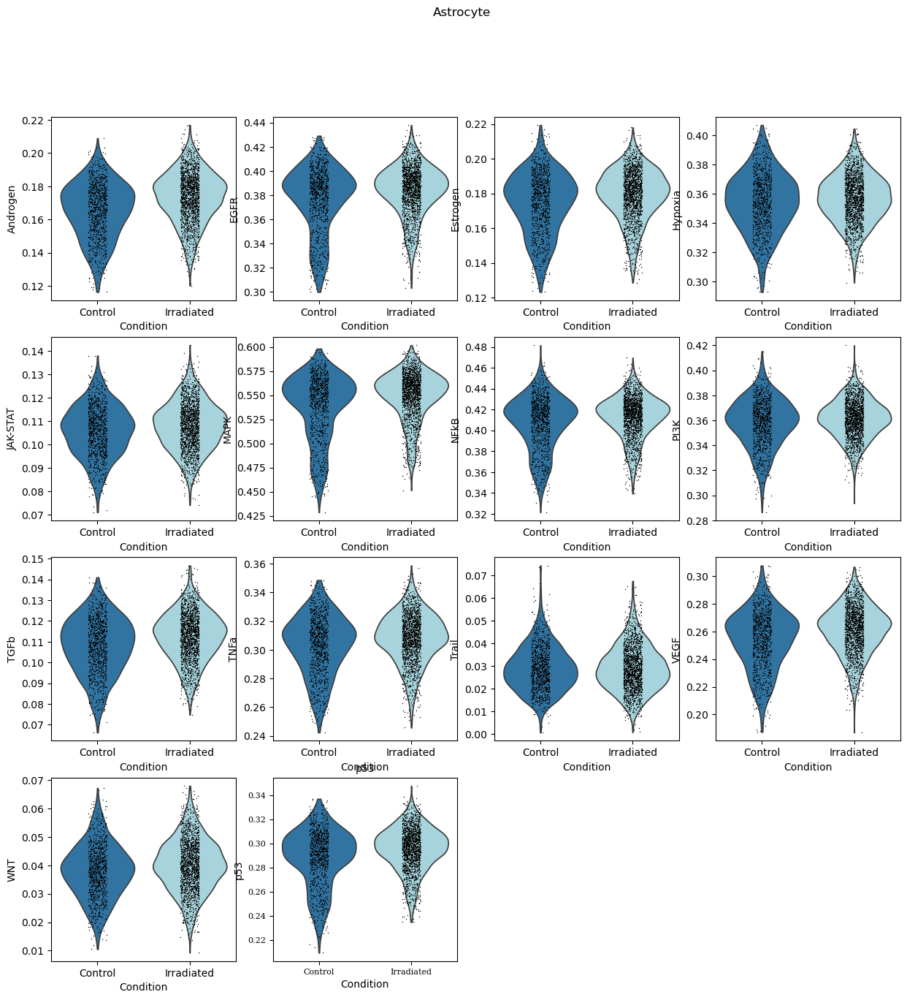

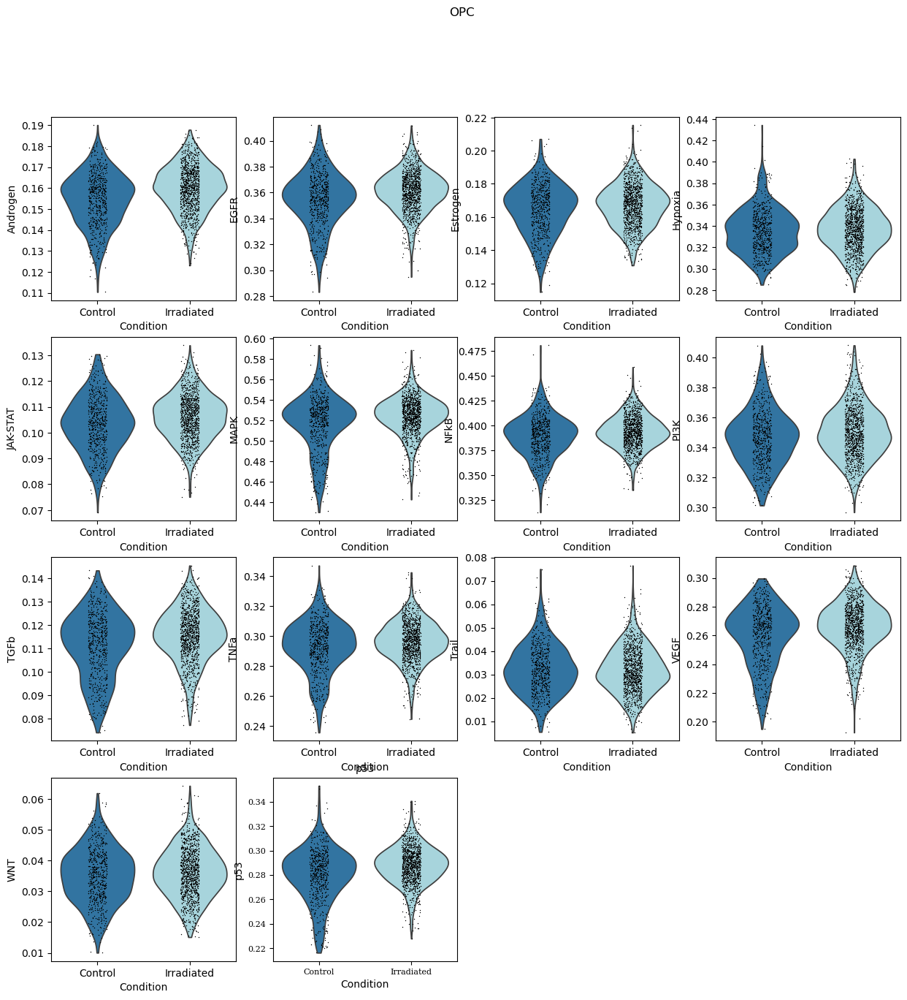

...

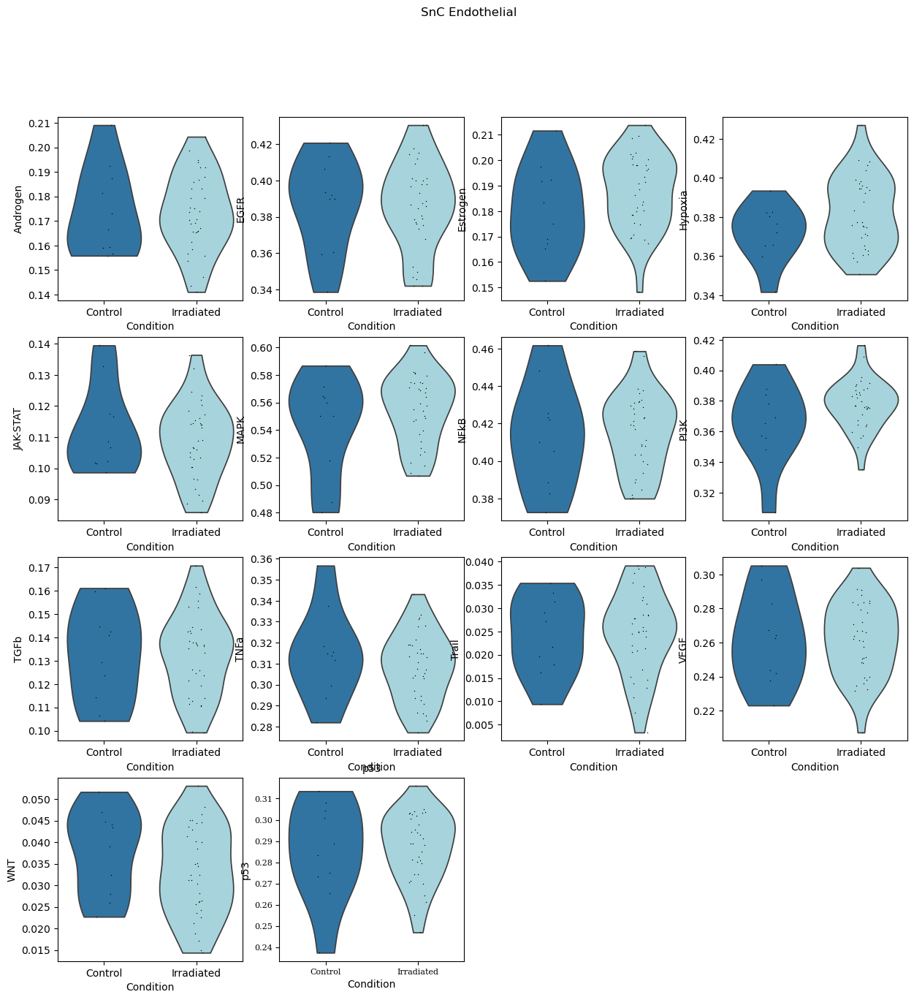

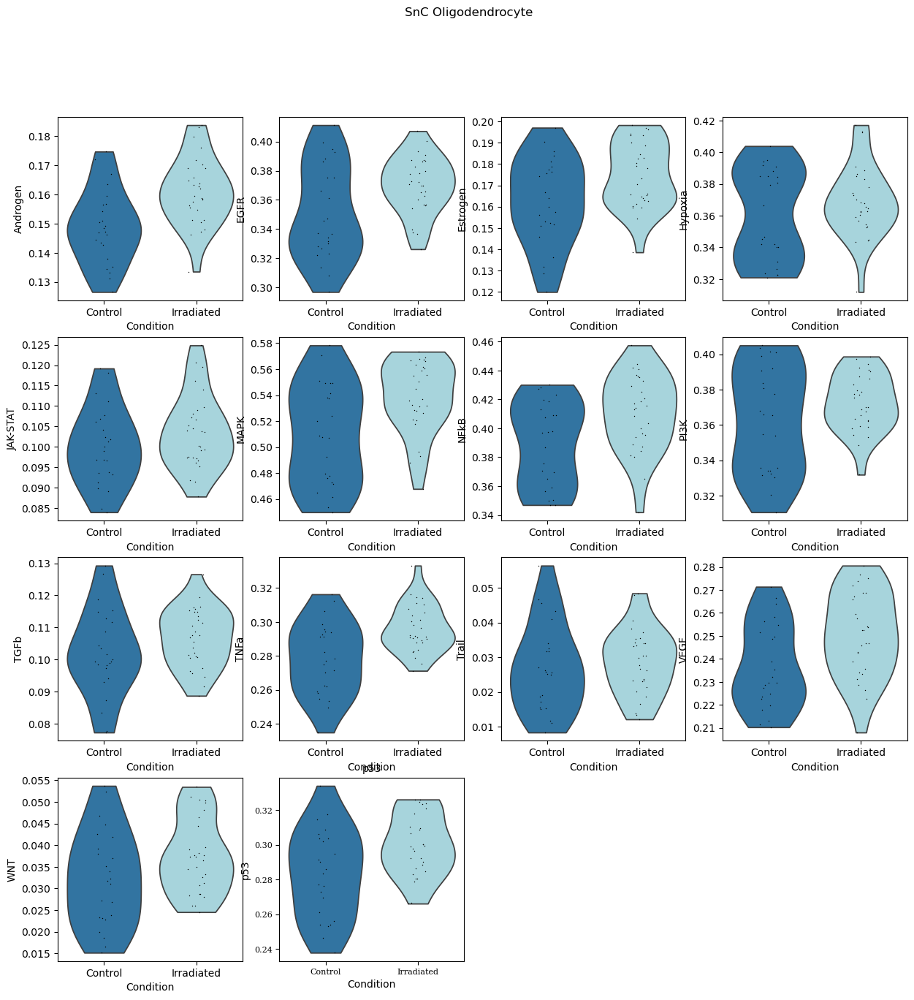

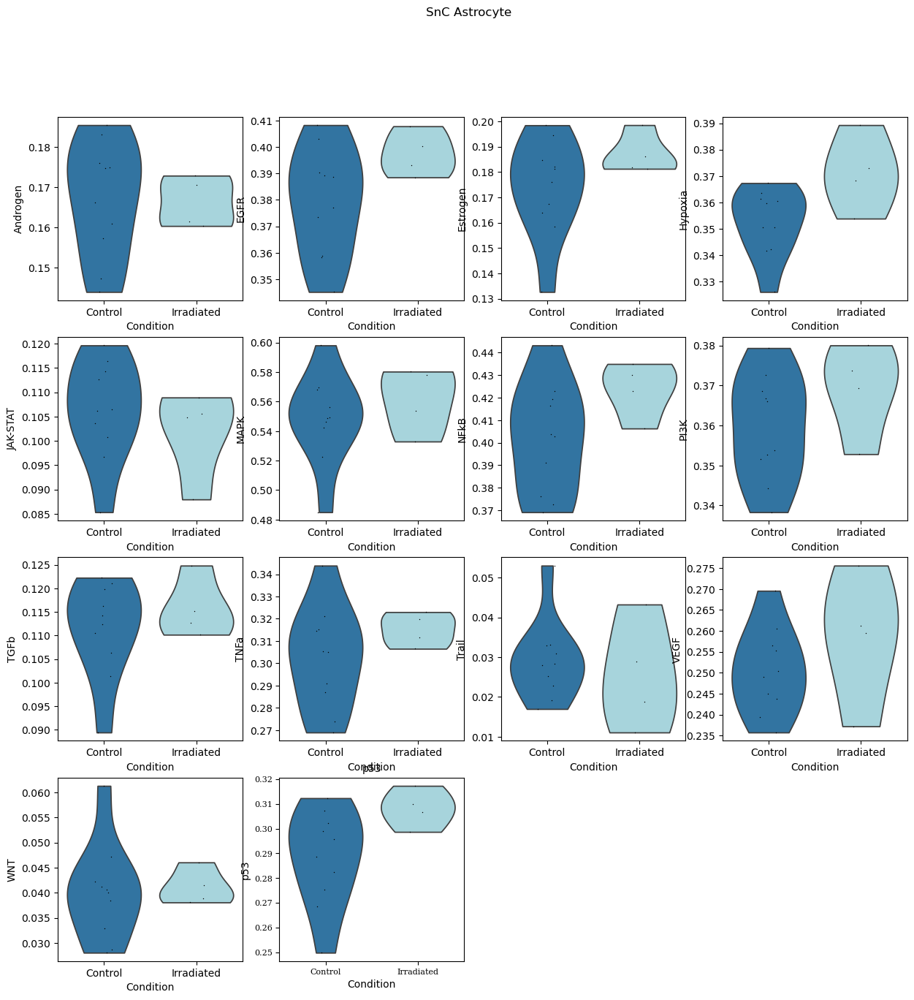

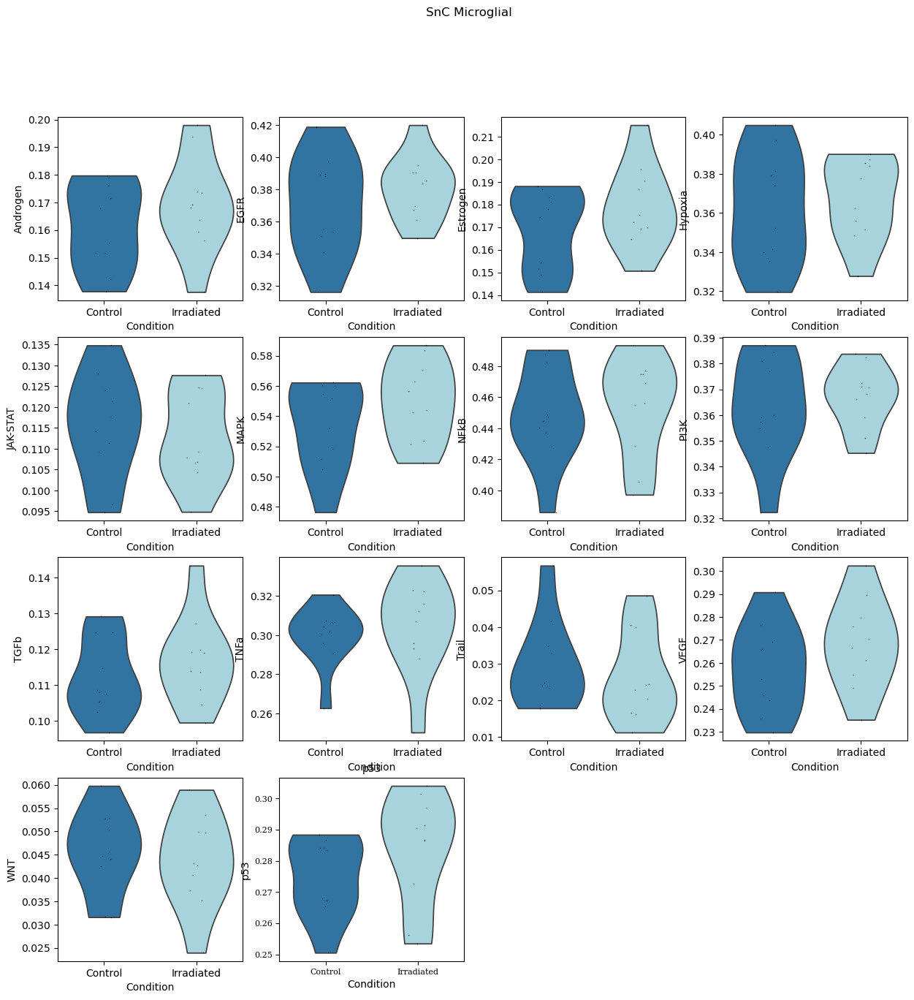

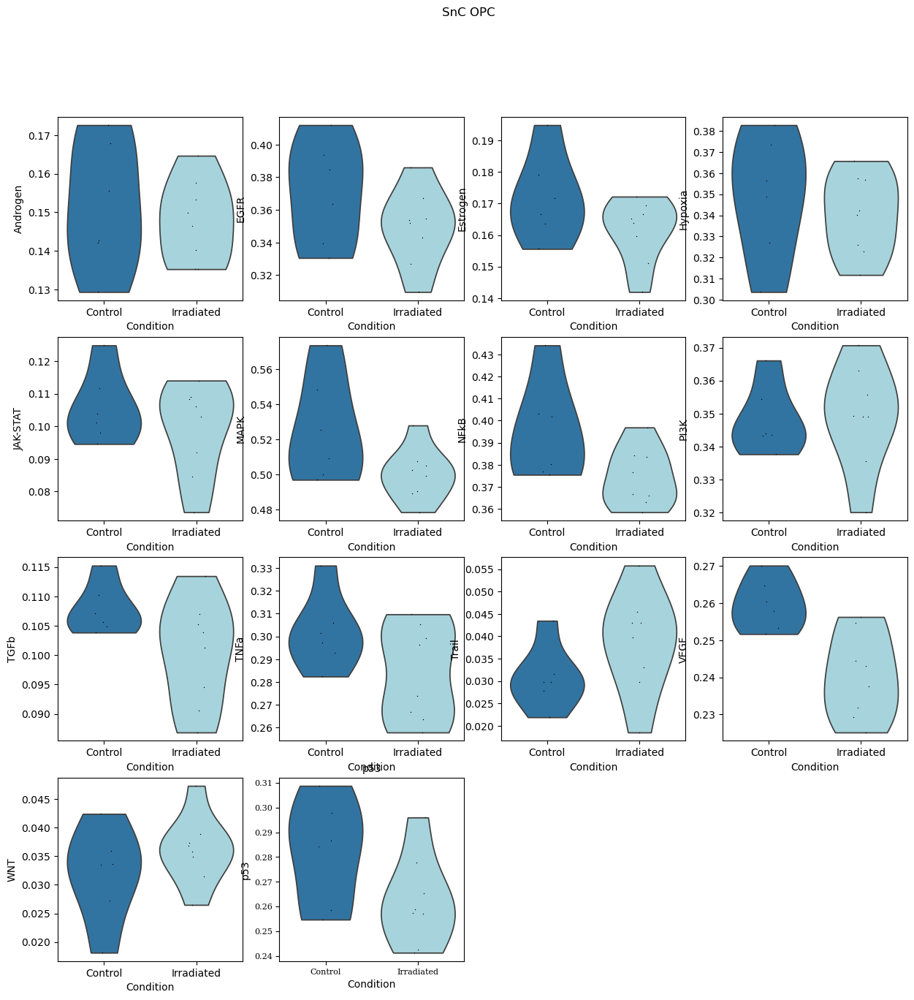

In [63]:
cvod = ["Senescent_Cell_Label_by_Type",
        "Senescent_Cell_Label_by_Type", col_condition]
res_aucell = scflow.ax.run_decoupler_aucell(
    self.rna, col_covariates=cvod,
    resource="progeny", species=species, inplace=True)
_ = self.plot(genes=list(self.rna.obsm["score_aucell"].columns),
              subset=self.rna.obs["Senescent_Cell"],
              col_celltype=col_condition, kind="violin",
              by_group="Senescent_Cell_Label_by_Type",
              figsize=(15, 15))

## Plot

In [142]:
ggg

{'Control': {'Neuron': ['Nrg1', 'Iqgap2', 'Ctsb', 'Hmgb1', 'Cd9'],
  'Oligodendrocyte': ['Cd9', 'Nrg1', 'Rps6ka5', 'Il18', 'Ctsb'],
  'Astrocyte': ['Igfbp5', 'Nrg1', 'Serpine2', 'Bmp6', 'Cd9'],
  'Microglial': ['Serpine2', 'Selplg', 'Nrg1', 'Ctsb', 'Cd9'],
  'OPC': ['Nrg1', 'Serpine2', 'Cd9', 'Ctnnb1', 'Il18'],
  'Endothelial': ['Kitl', 'Cxcl12', 'Igfbp7', 'Pecam1', 'Jun']},
 'Irradiated': {'Neuron': ['Nrg1', 'Hmgb1', 'Ctnnb1', 'Rps6ka5', 'Iqgap2'],
  'Oligodendrocyte': ['Nrg1', 'Cd9', 'Rps6ka5', 'Fgf1', 'Timp2'],
  'Astrocyte': ['Rps6ka5', 'Ctnnb1', 'Nrg1', 'Ctsb', 'Il18'],
  'Microglial': ['Nrg1', 'Ctsb', 'Selplg', 'Lcp1', 'Rps6ka5'],
  'OPC': ['Serpine2', 'Nrg1', 'Cd9', 'Nap1l4', 'Rps6ka5'],
  'Endothelial': ['Igfbp7', 'Nrg1', 'Kitl', 'Cxcl12', 'Il6st']}}

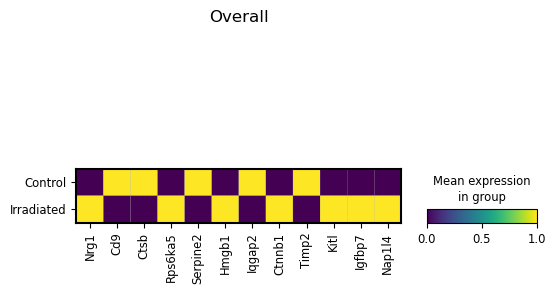

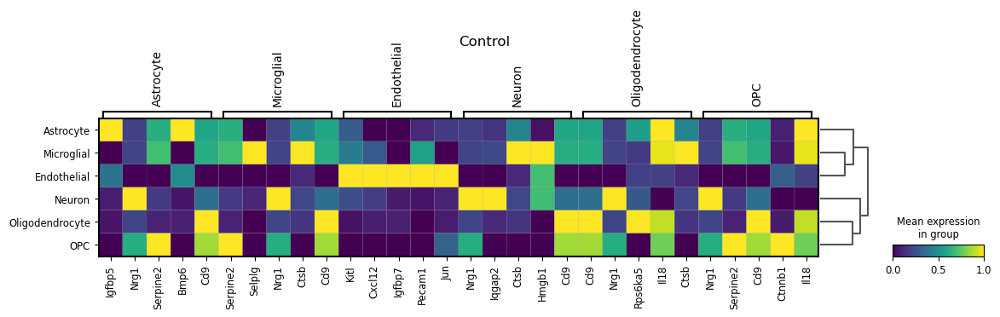

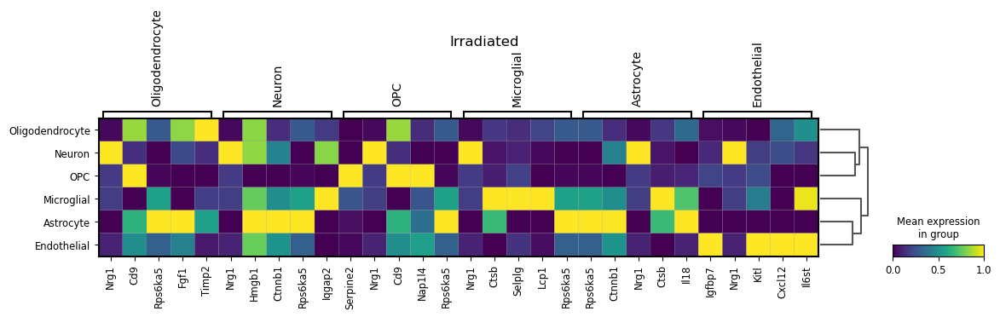

In [167]:
# Mask for High Senescence Subset & Helper Variable for Figure Dimensions
subset = self.rna.obs["Senescent_Cell"].isin([1, True])
num_cts = len(self.rna[subset].obs[col_celltype].unique())

# Get Top-Expressed Senescence Genes in SnCs
gex_sncs = sc.get.obs_df(self.rna[subset], genes).join(
    self.rna[subset].obs[[col_condition, col_celltype]])
gex_sncs_means = gex_sncs.groupby([col_condition, col_celltype]).mean()
ggg = gex_sncs_means.stack().groupby([
    col_condition, col_celltype]).apply(
        lambda x: list(x.sort_values(ascending=False).loc[
            x.name].index.values[:5]))
grps = ggg.reset_index()[col_condition].unique()
ggg = dict(zip(grps, [dict(ggg.loc[x]) for x in grps]))
ggg_collapsed = dict(pd.DataFrame(ggg).apply(lambda x: list(np.unique(
    x.iloc[0] + x.iloc[1])), axis=1))
gex_sncs_means_agg = gex_sncs.groupby(col_condition).apply(
    lambda x: x.drop(col_celltype, axis=1).mean())
ggg_collapsed_ct = gex_sncs_means_agg.stack().groupby([
    col_condition]).apply(lambda x: list(x.sort_values(ascending=False).loc[
        x.name].index.values[:10]))

# Overall
_ = self.plot(kind="matrix", genes=list(ggg_collapsed_ct.explode().unique()),
              col_celltype=col_condition, layer="log1p",
              subset=subset, dendrogram=True, swap_axes=False,
              standard_scale="var", title="Overall")

# Plot Most Highly-Expressed Genes in Each Senescent Cell Type
for x in grps:
    subsg = (subset) & (self.rna.obs[col_condition] == x)
    gsubs = set(ggg[x].keys()).intersection(self.rna.obs[subsg][
        col_celltype].unique())
    gsubs = dict(zip(gsubs, [ggg[x][i] for i in gsubs]))
    _ = self.plot(kind="matrix", genes=gsubs,
                  col_celltype=col_celltype, layer="log1p",
                  subset=subsg, dendrogram=True, swap_axes=False,
                  standard_scale="var", title=x)

# Write Object

In [168]:
# Send Email with Output When Done
if email is not None and html_out is not None:
    os.system(f"jupyter nbconvert --to html {cur_file}")
    os.system(f"echo 'yay' | mutt -s 'JOB DONE' -a {html_out} -- {email}")

if overwrite is True or os.path.exists() is False:
    self.rna.write_h5ad(file_path_new)
else:
    print(f"\n\n\n{'=' * 120}\nOVERWRITE IS FALSE..."
          f"NOT WRITING OBJECT!!!\n{'=' * 120}\n\n\n")

[NbConvertApp] Converting notebook /home/easlinger/AWG/ADBR/Brain_AWG/Senescence/analyze_senescence_celltype_specific_threshold_SRR23052428.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 59 image(s).
[NbConvertApp] Writing 14983833 bytes to /home/easlinger/AWG/ADBR/Brain_AWG/Senescence/analyze_senescence_celltype_specific_threshold_SRR23052428.html
Authenticating (PLAIN)...
Closing connection to imap.gmail.com...
